<a href="https://colab.research.google.com/github/marsyaaurel08/2341720011_ML_2025/blob/main/PBL_Klasifikasi_Jenis_Sayuran.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# KELOMPOK 5

Anggota:
1. Marsya Aurelia Sefira
2. Muhammad Rifda Musyafa'
3. Rakai Seto Sembodo
4. Rangga Dwi Saputra


# 1. Environment Setup & Library Imports


In [ ]:
# ============================================================
# Cell 1 – Environment Setup & Library Imports
# ============================================================
print("--- Cell 1: Installs & Imports ---")

!pip -q install kagglehub scikit-image scikit-learn matplotlib tqdm xgboost optuna

import os, json, math, random, shutil
from pathlib import Path
from collections import defaultdict
import joblib
import gc

import numpy as np
import pandas as pd
from tqdm import tqdm

import cv2
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    confusion_matrix, classification_report,
    ConfusionMatrixDisplay
)
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import (
    train_test_split, StratifiedKFold, GridSearchCV
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.base import clone

from skimage import color, exposure
from skimage.feature import hog, local_binary_pattern, graycomatrix, graycoprops

from xgboost import XGBClassifier
import optuna
import kagglehub

SEED = 42
np.random.seed(SEED)
random.seed(SEED)

print("Versions | OpenCV:", cv2.__version__)


--- Cell 1: Installs & Imports ---
Versions | OpenCV: 4.12.0


# 2. Directory Configuration

In [ ]:
# ============================================================
# Cell 2 – Directory Configuration
#   - Deteksi environment (Kaggle vs Colab)
#   - Buat folder untuk fitur & model
# ============================================================
print("\n--- Cell 2: Konfigurasi Direktori ---")

if Path("/kaggle/working").exists():
    ROOT_DIR = Path("/kaggle/working")
else:
    ROOT_DIR = Path("/content")

FEATURE_DIR    = ROOT_DIR / "features_hog_pca"
MODEL_SVM_DIR  = ROOT_DIR / "model_svm_hog_pca"
MODEL_KNN_DIR  = ROOT_DIR / "model_knn_hog_pca"
MODEL_XGB_DIR  = ROOT_DIR / "model_xgb_hog_pca"
ORANGE_DIR     = ROOT_DIR / "orange_exports_hog_pca"

for d in [FEATURE_DIR, MODEL_SVM_DIR, MODEL_KNN_DIR, MODEL_XGB_DIR, ORANGE_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print("ROOT_DIR      :", ROOT_DIR)
print("FEATURE_DIR   :", FEATURE_DIR)
print("MODEL_SVM_DIR :", MODEL_SVM_DIR)
print("MODEL_KNN_DIR :", MODEL_KNN_DIR)
print("MODEL_XGB_DIR :", MODEL_XGB_DIR)
print("ORANGE_DIR    :", ORANGE_DIR)



--- Cell 2: Konfigurasi Direktori ---
ROOT_DIR      : /content
FEATURE_DIR   : /content/features_hog_pca
MODEL_SVM_DIR : /content/model_svm_hog_pca
MODEL_KNN_DIR : /content/model_knn_hog_pca
MODEL_XGB_DIR : /content/model_xgb_hog_pca
ORANGE_DIR    : /content/orange_exports_hog_pca


# 3. Dataset Download & Base DataFrame

In [ ]:
# ============================================================
# Cell 3 – Dataset Download & Base DataFrame (df_all)
#   - Download dataset Kaggle
#   - Deteksi folder train/val/test
#   - Filter 5 kelas target
#   - Bentuk df_all (filepath, label)
# ============================================================
print("\n--- Cell 3: Download & Persiapan Path Dataset ---")

dataset_path = kagglehub.dataset_download("misrakahmed/vegetable-image-dataset")
root = Path(dataset_path)
print("Dataset root:", root)

# Cek nested folder
subdirs = [d for d in root.iterdir() if d.is_dir()]
if len(subdirs) == 1:
    cand = subdirs[0]
    if any((cand/x).exists() for x in ["train","validation","test","Train","Validation","Test"]):
        root = cand
        print("Detected nested split folder →", root)

def pick_one(names):
    for n in names:
        p = root / n
        if p.exists():
            return p
    for n in names:
        hits = [h for h in root.rglob(n) if h.is_dir()]
        if len(hits) > 0:
            return hits[0]
    return None

train_dir = pick_one(["train","Train","training","Training"])
val_dir   = pick_one(["validation","Validation","valid","val","Valid","Val"])
test_dir  = pick_one(["test","Test","testing"])

print("Resolved paths:")
print("  train     =", train_dir)
print("  validation=", val_dir)
print("  test      =", test_dir)
assert train_dir and val_dir and test_dir, "Struktur train/validation/test tidak ditemukan!"

def list_classes(d: Path):
    return sorted([x.name for x in d.iterdir() if x.is_dir()])

all_classes = list_classes(train_dir)
print(f"Semua kelas di dataset: {all_classes}")

TARGET_CLASSES = ["Broccoli", "Cabbage", "Carrot", "Cucumber", "Tomato"]
CLASSES = [c for c in all_classes if c in TARGET_CLASSES]
missing = [c for c in TARGET_CLASSES if c not in CLASSES]
assert len(missing) == 0, f"Kelas berikut tidak ditemukan di dataset: {missing}"

print(f"Classes yang dipakai ({len(CLASSES)}): {CLASSES}")
IMG_EXT = ("*.jpg","*.jpeg","*.png","*.bmp","*.JPG","*.JPEG","*.PNG","*.BMP")

def collect_files_labels(split_dir: Path):
    files, labels = [], []
    for c in CLASSES:
        cdir = split_dir / c
        if not cdir.exists():
            continue
        for ext in IMG_EXT:
            files_found = list(cdir.glob(ext))
            files.extend([str(f) for f in files_found])
            labels.extend([c] * len(files_found))
    return files, labels

X_train_f, y_train_labels = collect_files_labels(train_dir)
X_val_f,   y_val_labels   = collect_files_labels(val_dir)
X_test_f,  y_test_labels  = collect_files_labels(test_dir)
print(f"Counts (Kaggle split) → train={len(X_train_f)} | val={len(X_val_f)} | test={len(X_test_f)}")

all_files  = np.array(X_train_f + X_val_f + X_test_f)
all_labels = np.array(y_train_labels + y_val_labels + y_test_labels)

df_all = pd.DataFrame({"filepath": all_files, "label": all_labels})
df_all = df_all[df_all["label"].isin(CLASSES)].reset_index(drop=True)
print(f"Total sampel (5 kelas, gabungan semua split Kaggle): {len(df_all)}")

print("\nDistribusi kelas global:")
display(df_all["label"].value_counts())


--- Cell 3: Download & Persiapan Path Dataset ---
Using Colab cache for faster access to the 'vegetable-image-dataset' dataset.
Dataset root: /kaggle/input/vegetable-image-dataset
Detected nested split folder → /kaggle/input/vegetable-image-dataset/Vegetable Images
Resolved paths:
  train     = /kaggle/input/vegetable-image-dataset/Vegetable Images/train
  validation= /kaggle/input/vegetable-image-dataset/Vegetable Images/validation
  test      = /kaggle/input/vegetable-image-dataset/Vegetable Images/test
Semua kelas di dataset: ['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']
Classes yang dipakai (5): ['Broccoli', 'Cabbage', 'Carrot', 'Cucumber', 'Tomato']
Counts (Kaggle split) → train=5000 | val=1000 | test=1000
Total sampel (5 kelas, gabungan semua split Kaggle): 7000

Distribusi kelas global:


,count
label,
Broccoli,1400
Cabbage,1400
Carrot,1400
Cucumber,1400
Tomato,1400


# 4. Stratified Data Splits

In [ ]:
# ============================================================
# Cell 4 – Stratified Data Splits & Registry SPLITS
#   - Fungsi make_stratified_split
#   - Definisi 60:20:20, 70:15:15, 80:10:10, 90:5:5
#   - Simpan ke dict SPLITS
# ============================================================
print("\n--- Cell 4: Fungsi Split Shared & Registry SPLITS ---")

def make_stratified_split(df, train_ratio, val_ratio, test_ratio, seed=SEED):
    assert abs(train_ratio + val_ratio + test_ratio - 1.0) < 1e-6, "Rasio tidak valid"

    df_train, df_temp = train_test_split(
        df,
        test_size=(1.0 - train_ratio),
        stratify=df["label"],
        random_state=seed
    )
    if val_ratio == 0 or test_ratio == 0:
        return df_train, df_temp, pd.DataFrame(columns=df.columns)

    rel_val = val_ratio / (val_ratio + test_ratio)
    df_val, df_test = train_test_split(
        df_temp,
        test_size=(1.0 - rel_val),
        stratify=df_temp["label"],
        random_state=seed
    )
    return df_train, df_val, df_test

split_configs = [
    ("60_20_20", "60:20:20", 0.60, 0.20, 0.20),
    ("70_15_15", "70:15:15", 0.70, 0.15, 0.15),
    ("80_10_10", "80:10:10", 0.80, 0.10, 0.10),
    ("90_5_5",   "90:5:5",   0.90, 0.05, 0.05),
]

SPLITS = {}

for split_tag, split_name, r_tr, r_val, r_te in split_configs:
    print(f"\n>>> Membuat split {split_name} (train={r_tr}, val={r_val}, test={r_te})")
    df_train, df_val, df_test = make_stratified_split(
        df_all.copy(),
        train_ratio=r_tr,
        val_ratio=r_val,
        test_ratio=r_te,
        seed=SEED
    )

    idx_train = df_train.index.to_numpy()
    idx_val   = df_val.index.to_numpy()
    idx_test  = df_test.index.to_numpy()

    print(f"  train={len(idx_train)}, val={len(idx_val)}, test={len(idx_test)}")

    SPLITS[split_tag] = {
        "tag": split_tag,
        "name": split_name,
        "train_ratio": r_tr,
        "val_ratio":   r_val,
        "test_ratio":  r_te,
        "df_train": df_train,
        "df_val":   df_val,
        "df_test":  df_test,
        "idx_train": idx_train,
        "idx_val":   idx_val,
        "idx_test":  idx_test,
    }

print("\nSPLITS tersedia:", list(SPLITS.keys()))


--- Cell 4: Fungsi Split Shared & Registry SPLITS ---

>>> Membuat split 60:20:20 (train=0.6, val=0.2, test=0.2)
  train=4200, val=1400, test=1400

>>> Membuat split 70:15:15 (train=0.7, val=0.15, test=0.15)
  train=4899, val=1050, test=1051

>>> Membuat split 80:10:10 (train=0.8, val=0.1, test=0.1)
  train=5600, val=700, test=700

>>> Membuat split 90:5:5 (train=0.9, val=0.05, test=0.05)
  train=6300, val=350, test=350

SPLITS tersedia: ['60_20_20', '70_15_15', '80_10_10', '90_5_5']


# 5. Image Pre-processing & Visualisation


--- Cell 5: Fungsi Pre-processing & Visualisasi Sampel ---

### Visualisasi 5 Kelas (Sebelum & Sesudah Pre-processing + Histogram) ###


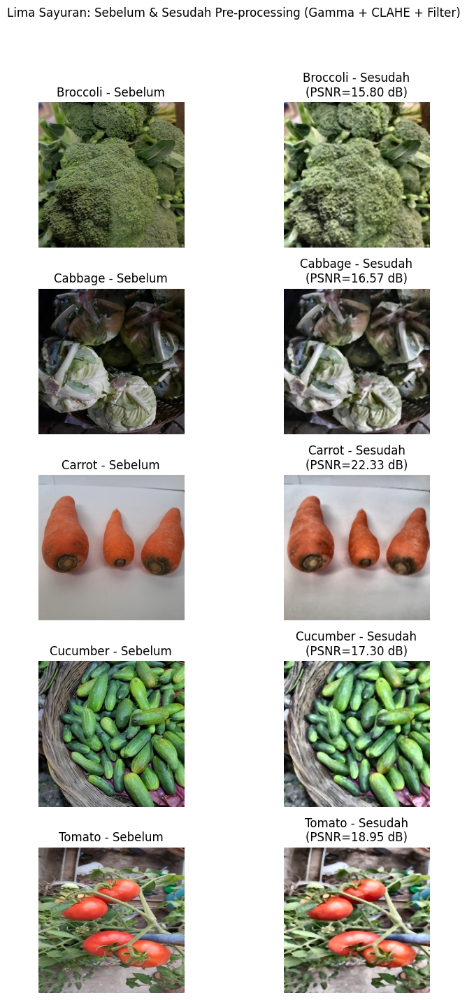

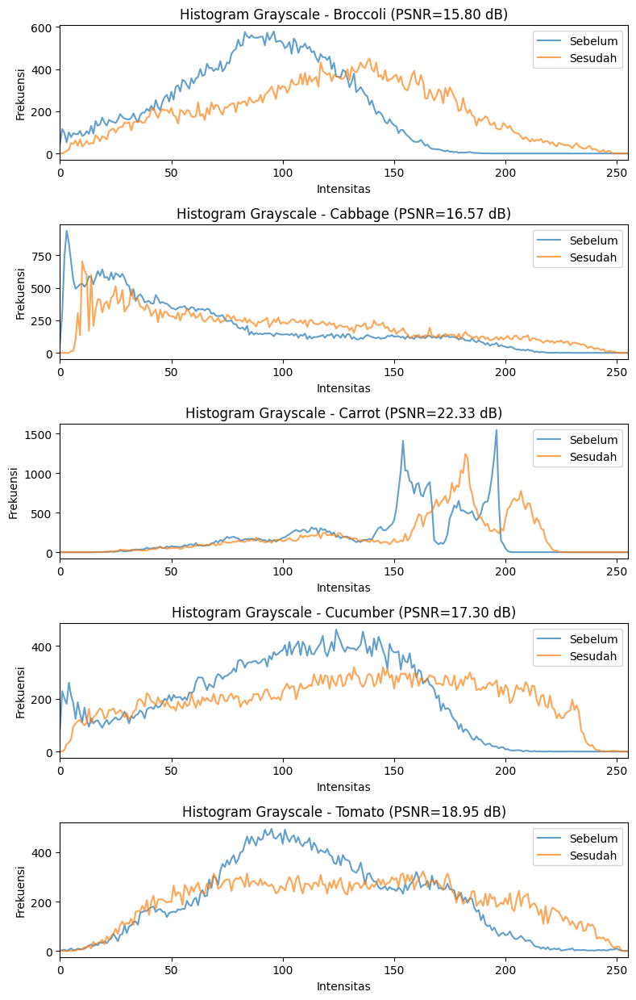

In [ ]:
# ============================================================
# Cell 5 – Image Pre-processing & Visualisasi
#   - Gamma + CLAHE + spatial filter
#   - Tanpa resize (pakai ukuran asli 224x224)
#   - PSNR & histogram grayscale
# ============================================================
print("\n--- Cell 5: Fungsi Pre-processing & Visualisasi Sampel ---")

def adjust_brightness_contrast(img, alpha=1.1, beta=5):
    return cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

def clahe_rgb(img, clip=2.0, tile=8):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=(tile,tile))
    l2 = clahe.apply(l)
    lab2 = cv2.merge([l2, a, b])
    return cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

def gamma_correction(img, gamma=1.0):
    gamma = max(1e-6, gamma)
    inv = 1.0 / gamma
    table = np.array([(i/255.0)**inv * 255 for i in range(256)]).astype("uint8")
    return cv2.LUT(img, table)

def spatial_filter(img, mode="median"):
    if mode == "median":
        return cv2.medianBlur(img, 3)
    if mode == "gaussian":
        return cv2.GaussianBlur(img, (3,3), 0)
    if mode == "bilateral":
        return cv2.bilateralFilter(img, 5, 50, 50)
    return img

def preprocess(
    img_bgr,
    do_bc=False, alpha=1.1, beta=5,
    do_clahe=True, clahe_clip=2.0, clahe_tile=8,
    do_gamma=True, gamma_val=1.05,
    do_filter=True, filter_mode="median"
):
    out = img_bgr.copy()
    if do_bc:
        out = adjust_brightness_contrast(out, alpha=alpha, beta=beta)
    if do_clahe:
        out = clahe_rgb(out, clip=clahe_clip, tile=clahe_tile)
    if do_gamma:
        out = gamma_correction(out, gamma=gamma_val)
    if do_filter:
        out = spatial_filter(out, mode=filter_mode)
    return out

def MSE(a, b):
    a = a.astype(np.float32)
    b = b.astype(np.float32)
    return float(np.mean((a-b)**2))

def PSNR(a, b):
    mse = MSE(a, b)
    if mse == 0:
        return 99.0
    PIXEL_MAX = 255.0
    return float(20 * math.log10(PIXEL_MAX / math.sqrt(mse)))

pp_config_gamma_only = {
    'do_bc': False,
    'do_gamma': True,
    'do_clahe': True,
    'do_filter': True
}

print("\n### Visualisasi 5 Kelas (Sebelum & Sesudah Pre-processing + Histogram) ###")
example_indices = {}
for idx, (fpath, label) in enumerate(zip(X_train_f, y_train_labels)):
    if label in CLASSES and label not in example_indices:
        example_indices[label] = idx
    if len(example_indices) == len(CLASSES):
        break

selected_classes = [c for c in CLASSES if c in example_indices]
n_classes = len(selected_classes)

if n_classes == 0:
    print("Tidak ditemukan contoh untuk visualisasi.")
else:
    fig_img, axes_img = plt.subplots(n_classes, 2, figsize=(8, 3 * n_classes))
    if n_classes == 1:
        axes_img = np.expand_dims(axes_img, axis=0)

    psnr_values = {}

    for row, cls in enumerate(selected_classes):
        idx = example_indices[cls]
        img_path = X_train_f[idx]

        img_raw = cv2.imread(img_path)        # ukuran asli 224x224
        img_pp  = preprocess(img_raw, **pp_config_gamma_only)
        psnr_val = PSNR(img_raw, img_pp)
        psnr_values[cls] = psnr_val

        ax0 = axes_img[row, 0]
        ax0.imshow(cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB))
        ax0.set_title(f"{cls} - Sebelum")
        ax0.axis('off')

        ax1 = axes_img[row, 1]
        ax1.imshow(cv2.cvtColor(img_pp, cv2.COLOR_BGR2RGB))
        ax1.set_title(f"{cls} - Sesudah\n(PSNR={psnr_val:.2f} dB)")
        ax1.axis('off')

    plt.suptitle("Lima Sayuran: Sebelum & Sesudah Pre-processing (Gamma + CLAHE + Filter)")
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    fig_hist, axes_hist = plt.subplots(n_classes, 1, figsize=(8, 2.5 * n_classes))
    if n_classes == 1:
        axes_hist = np.expand_dims(axes_hist, axis=0)

    for row, cls in enumerate(selected_classes):
        idx = example_indices[cls]
        img_path = X_train_f[idx]

        img_raw = cv2.imread(img_path)
        img_pp  = preprocess(img_raw, **pp_config_gamma_only)

        gray_raw = cv2.cvtColor(img_raw, cv2.COLOR_BGR2GRAY)
        gray_pp  = cv2.cvtColor(img_pp,  cv2.COLOR_BGR2GRAY)

        hist_raw, _ = np.histogram(gray_raw.ravel(), bins=256, range=(0, 256))
        hist_pp, _  = np.histogram(gray_pp.ravel(),  bins=256, range=(0, 256))

        axh = axes_hist[row]
        axh.plot(hist_raw, label="Sebelum", alpha=0.7)
        axh.plot(hist_pp,  label="Sesudah", alpha=0.7)
        axh.set_title(f"Histogram Grayscale - {cls} (PSNR={psnr_values[cls]:.2f} dB)")
        axh.set_xlim(0, 255)
        axh.set_ylabel("Frekuensi")
        axh.set_xlabel("Intensitas")
        axh.legend()

    plt.tight_layout()
    plt.show()

# 6. Classical Feature Extraction Functions

<>:98: SyntaxWarning: invalid escape sequence '\V'
<>:98: SyntaxWarning: invalid escape sequence '\V'
/tmp/ipython-input-791978652.py:98: SyntaxWarning: invalid escape sequence '\V'
  print("\Visualisasi Feature Map (HOG, LBP, GLCM, Color Moments) ---")



--- Cell 6: Fungsi Ekstraksi Fitur ---
Contoh dimensi fitur total: (26311,)
  - Color Moments (HSV): 9 fitur
  - HOG: 26244 fitur
  - LBP: 10 fitur
  - GLCM: 48 fitur
  - Total: 26311
\Visualisasi Feature Map (HOG, LBP, GLCM, Color Moments) ---


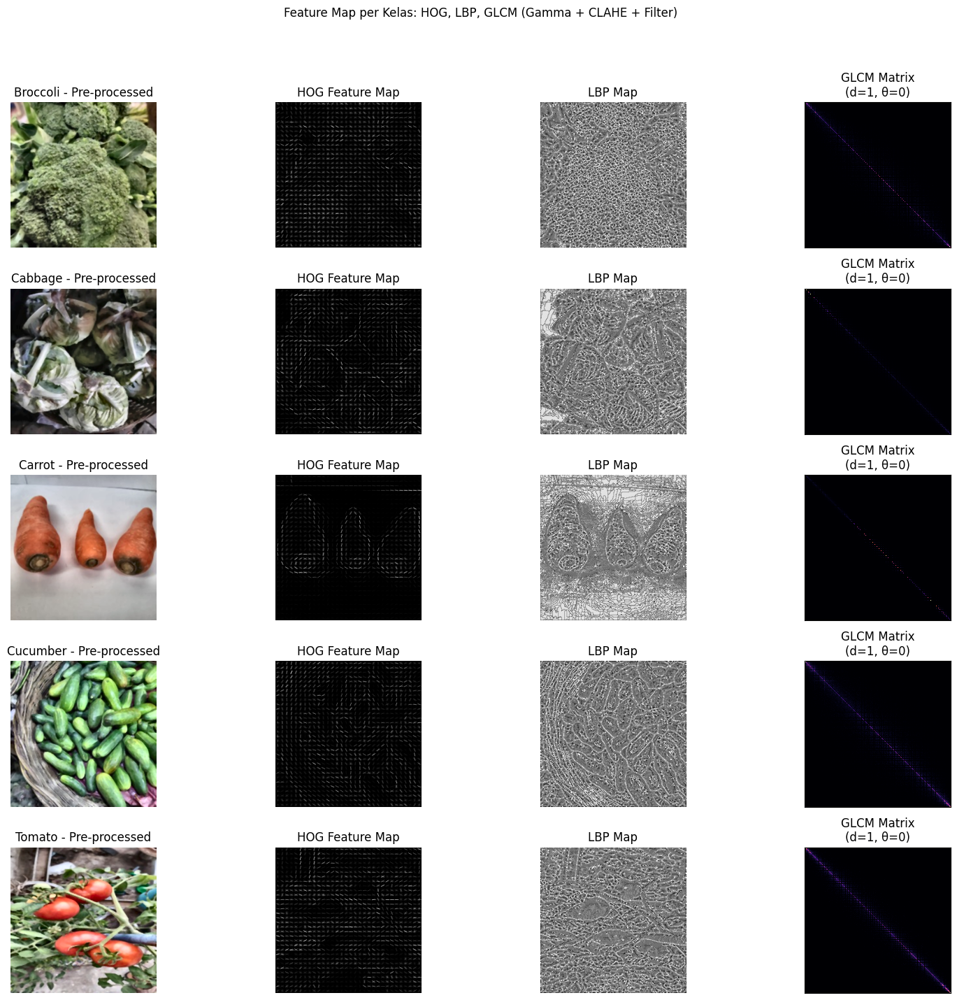


### Ringkasan Color Moments (HSV) per Kelas ###


,class,mean_H,mean_S,mean_V,std_H,std_S,std_V,skew_H,skew_S,skew_V
0,Broccoli,39.408218,88.216736,127.476089,10.455284,40.648342,51.435635,6.384262,1.779159,-0.150446
1,Cabbage,49.551758,46.413422,97.974686,43.086483,38.501003,64.045761,1.344738,1.470023,0.462351
2,Carrot,46.665878,56.718063,178.960434,53.789661,69.422241,33.220024,0.950588,1.074055,-1.469276
3,Cucumber,61.108917,84.841949,141.634171,35.668514,54.445274,66.022270,1.261729,0.712511,-0.136411
4,Tomato,41.233551,79.000427,146.521606,45.544464,60.703804,64.156334,1.743230,1.111447,0.045107


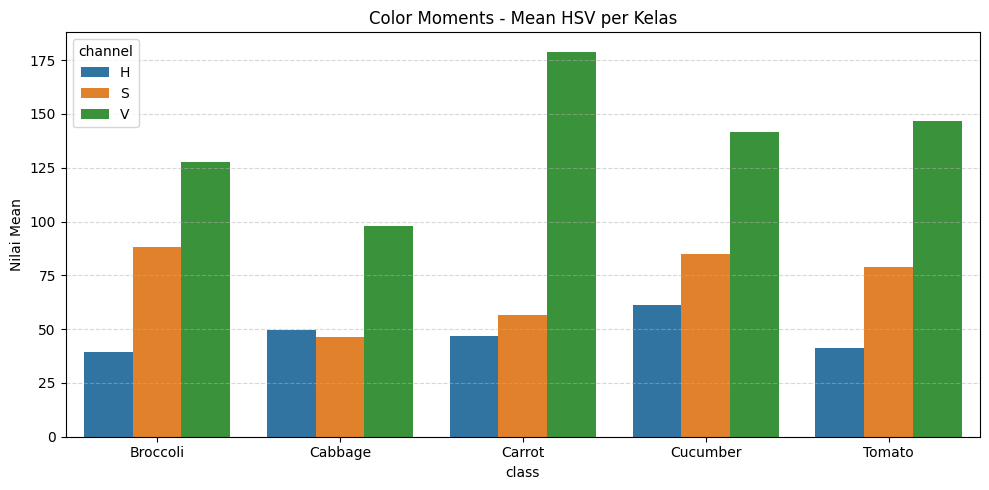

In [ ]:
# ============================================================
# Cell 6 – Classical Feature Extraction (CM, HOG, LBP, GLCM)
#   - Definisi fitur warna & tekstur
#   - extract_features_from_img (tanpa PCA)
# ============================================================
print("\n--- Cell 6: Fungsi Ekstraksi Fitur ---")

def color_moments_hsv(img_bgr):
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    feats = []
    for c in range(3):
        channel = hsv[:,:,c].astype(np.float32)
        mean = np.mean(channel)
        std  = np.std(channel)
        eps = 1e-6
        skew = np.mean(((channel - mean) / (std + eps))**3)
        feats.extend([mean, std, skew])
    return np.array(feats, dtype=np.float32)  # 9 fitur

def hog_feat(img_gray, pixels_per_cell=(8,8), cells_per_block=(2,2), orientations=9):
    feat = hog(
        img_gray,
        orientations=orientations,
        pixels_per_cell=pixels_per_cell,
        cells_per_block=cells_per_block,
        block_norm='L2-Hys',
        transform_sqrt=True,
        feature_vector=True
    )
    return feat.astype(np.float32)

def lbp_hist(img_gray, P=8, R=1.0):
    lbp = local_binary_pattern(img_gray, P=P, R=R, method='uniform')
    (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, P+3), range=(0, P+2))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)
    return hist.astype(np.float32)  # 10 fitur

def glcm_props(
    img_gray,
    distances=(1,2),
    angles=(0, np.pi/4, np.pi/2, 3*np.pi/4)
):
    img8 = cv2.equalizeHist(img_gray)
    glcm = graycomatrix(
        img8,
        distances=distances,
        angles=angles,
        levels=256,
        symmetric=True,
        normed=True
    )
    props = []
    for prop in ("contrast", "dissimilarity", "homogeneity", "ASM", "energy", "correlation"):
        vals = graycoprops(glcm, prop)
        props.extend(list(vals.flatten()))
    return np.array(props, dtype=np.float32)

def extract_features_from_img(img_bgr, preprocess_cfg=None):
    if preprocess_cfg is None:
        preprocess_cfg = {}
    img_pp = preprocess(img_bgr, **preprocess_cfg)
    gray   = cv2.cvtColor(img_pp, cv2.COLOR_BGR2GRAY)

    cm   = color_moments_hsv(img_pp)
    hg   = hog_feat(gray)
    lb   = lbp_hist(gray, P=8, R=1.0)
    gcft = glcm_props(gray)

    feat = np.concatenate([cm, hg, lb, gcft], axis=0)
    return feat, img_pp, (cm, hg, lb, gcft)

def extract_features_for_file(fpath, preprocess_cfg=None, resize=None):
    img = cv2.imread(fpath, cv2.IMREAD_COLOR)
    if img is None:
        raise RuntimeError(f"Gagal baca: {fpath}")
    if resize is not None:
        img = cv2.resize(img, resize)
    img_original = img.copy()
    feat, img_pp, blocks = extract_features_from_img(img, preprocess_cfg)
    return feat, img_original, img_pp, blocks

# Cek dimensi & laporkan berapa fitur tiap metode
tmp_feat, _, _, (cm_s, hog_s, lbp_s, glcm_s) = extract_features_for_file(
    df_all["filepath"].iloc[0],
    preprocess_cfg=pp_config_gamma_only,
    resize=None
)
print("Contoh dimensi fitur total:", tmp_feat.shape)
print("  - Color Moments (HSV):", cm_s.shape[0], "fitur")
print("  - HOG:", hog_s.shape[0], "fitur")
print("  - LBP:", lbp_s.shape[0], "fitur")
print("  - GLCM:", glcm_s.shape[0], "fitur")
print("  - Total:", cm_s.shape[0] + hog_s.shape[0] + lbp_s.shape[0] + glcm_s.shape[0])

#============================================================================================================================================================

print("\Visualisasi Feature Map (HOG, LBP, GLCM, Color Moments) ---")

pp_config_gamma_only = {
    'do_bc': False,
    'do_gamma': True,
    'do_clahe': True,
    'do_filter': True
}

if len(X_train_f) == 0:
    print("Tidak ada data train untuk divisualisasikan.")
else:
    # Cari 1 sampel per kelas
    example_indices = {}
    for idx, (fpath, label) in enumerate(zip(X_train_f, y_train_labels)):
        if label in CLASSES and label not in example_indices:
            example_indices[label] = idx
        if len(example_indices) == len(CLASSES):
            break

    selected_classes = [c for c in CLASSES if c in example_indices]
    n_classes = len(selected_classes)

    if n_classes == 0:
        print("Tidak ditemukan sampel per kelas untuk visualisasi feature map.")
    else:
        # 4 kolom: Preprocessed RGB, HOG, LBP, GLCM
        fig, axes = plt.subplots(n_classes, 4, figsize=(16, 3 * n_classes))
        if n_classes == 1:
            axes = np.expand_dims(axes, axis=0)

        color_moments_summary = []

        for row, cls in enumerate(selected_classes):
            idx = example_indices[cls]
            img_path = X_train_f[idx]

            # Baca & pre-process
            img_raw = cv2.imread(img_path)
            img_raw = cv2.resize(img_raw, (256, 256))
            img_pp  = preprocess(img_raw, **pp_config_gamma_only)
            gray_pp = cv2.cvtColor(img_pp, cv2.COLOR_BGR2GRAY)

            # HOG visual
            hog_feat_map, hog_vis = hog(
                gray_pp,
                orientations=9,
                pixels_per_cell=(8, 8),
                cells_per_block=(2, 2),
                block_norm='L2-Hys',
                transform_sqrt=True,
                visualize=True,
                feature_vector=True
            )

            # LBP map
            lbp = local_binary_pattern(gray_pp, P=8, R=1.0, method='uniform')
            lbp_norm = (lbp - lbp.min()) / (lbp.max() - lbp.min() + 1e-6)
            lbp_vis = (lbp_norm * 255).astype("uint8")

            # GLCM matrix (d=1, angle=0)
            img8 = cv2.equalizeHist(gray_pp)
            glcm = graycomatrix(
                img8,
                distances=[1],
                angles=[0],
                levels=256,
                symmetric=True,
                normed=True
            )
            glcm_vis = glcm[:, :, 0, 0]

            # Color Moments (HSV)
            hsv = cv2.cvtColor(img_pp, cv2.COLOR_BGR2HSV).astype(np.float32)
            means = hsv.mean(axis=(0, 1))
            stds  = hsv.std(axis=(0, 1))
            eps   = 1e-6
            skews = np.mean(
                ((hsv - means.reshape(1, 1, 3)) / (stds.reshape(1, 1, 3) + eps))**3,
                axis=(0, 1)
            )

            color_moments_summary.append({
                "class": cls,
                "mean_H": means[0], "mean_S": means[1], "mean_V": means[2],
                "std_H": stds[0],   "std_S": stds[1],   "std_V": stds[2],
                "skew_H": skews[0], "skew_S": skews[1], "skew_V": skews[2],
            })

            # Plot
            ax0 = axes[row, 0]
            ax0.imshow(cv2.cvtColor(img_pp, cv2.COLOR_BGR2RGB))
            ax0.set_title(f"{cls} - Pre-processed")
            ax0.axis('off')

            ax1 = axes[row, 1]
            ax1.imshow(hog_vis, cmap='gray')
            ax1.set_title("HOG Feature Map")
            ax1.axis('off')

            ax2 = axes[row, 2]
            ax2.imshow(lbp_vis, cmap='gray')
            ax2.set_title("LBP Map")
            ax2.axis('off')

            ax3 = axes[row, 3]
            im = ax3.imshow(glcm_vis, cmap='magma', interpolation='nearest')
            ax3.set_title("GLCM Matrix\n(d=1, θ=0)")
            ax3.set_xticks([])
            ax3.set_yticks([])

        plt.suptitle("Feature Map per Kelas: HOG, LBP, GLCM (Gamma + CLAHE + Filter)")
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # Visualisasi Color Moments
        print("\n### Ringkasan Color Moments (HSV) per Kelas ###")
        df_cm = pd.DataFrame(color_moments_summary)
        display(df_cm)

        df_mean = df_cm.melt(
            id_vars=["class"],
            value_vars=["mean_H", "mean_S", "mean_V"],
            var_name="stat_channel",
            value_name="value"
        )
        df_mean["channel"] = df_mean["stat_channel"].str[-1]

        plt.figure(figsize=(10, 5))
        sns.barplot(
            data=df_mean,
            x="class",
            y="value",
            hue="channel"
        )
        plt.title("Color Moments - Mean HSV per Kelas")
        plt.ylabel("Nilai Mean")
        plt.grid(axis='y', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()


# 7. Global Feature Extraction X_all, y_all + blok dimensi

In [ ]:
# ============================================================
# Cell 7 – Global Feature Extraction (X_all, y_all)
#   - Ekstraksi fitur untuk seluruh df_all
#   - Simpan / load dari disk
# ============================================================
print("\n--- Cell 7: Ekstraksi Fitur Global (Gamma+CLAHE+Filter) ---")

X_path  = FEATURE_DIR / "X_all_gamma_feats_hog_pca.npy"
y_path  = FEATURE_DIR / "y_all_labels_hog_pca.npy"
le_path = FEATURE_DIR / "label_encoder_hog_pca.pkl"

if X_path.exists() and y_path.exists() and le_path.exists():
    print("✓ File fitur global sudah ada, load dari disk...")
    X_all = np.load(X_path)
    y_all = np.load(y_path)
    le    = joblib.load(le_path)
    print("Shape X_all :", X_all.shape)
    print("Shape y_all :", y_all.shape)
    print("LabelEncoder classes:", list(le.classes_))
else:
    print("→ File fitur global belum ada, melakukan ekstraksi dari awal...")

    le = LabelEncoder()
    df_all["label_idx"] = le.fit_transform(df_all["label"])
    print("LabelEncoder classes:", list(le.classes_))

    X_feats = []
    y_idx = []

    for i, row in tqdm(df_all.iterrows(), total=len(df_all), desc="Extracting features df_all"):
        fpath   = row["filepath"]
        label_i = row["label_idx"]
        try:
            feat, _, _, _ = extract_features_for_file(
                fpath,
                preprocess_cfg=pp_config_gamma_only,
                resize=None   # tidak resize (224x224)
            )
            X_feats.append(feat)
            y_idx.append(label_i)
        except Exception as e:
            print(f"[WARNING] Gagal memproses {fpath} → {e}")

    X_all = np.vstack(X_feats).astype(np.float32)
    y_all = np.array(y_idx, dtype=np.int64)

    print("Shape X_all :", X_all.shape)
    print("Shape y_all :", y_all.shape)

    np.save(X_path, X_all)
    np.save(y_path, y_all)
    joblib.dump(le, le_path)

    print("✓ Ekstraksi fitur global selesai & disimpan di:", FEATURE_DIR)

# Hitung dimensi blok fitur dari sampel
print("\n--- Ringkasan dimensi blok fitur ---")
sample_path = df_all["filepath"].iloc[0]
img_sample = cv2.imread(sample_path, cv2.IMREAD_COLOR)
img_pp_sample = preprocess(img_sample, **pp_config_gamma_only)
gray_sample   = cv2.cvtColor(img_pp_sample, cv2.COLOR_BGR2GRAY)

cm_sample   = color_moments_hsv(img_pp_sample)
hog_sample  = hog_feat(gray_sample)
lbp_sample  = lbp_hist(gray_sample, P=8, R=1.0)
glcm_sample = glcm_props(gray_sample)

DIM_CM   = cm_sample.shape[0]
DIM_HOG  = hog_sample.shape[0]
DIM_LBP  = lbp_sample.shape[0]
DIM_GLCM = glcm_sample.shape[0]

print(f"DIM_CM   = {DIM_CM}")
print(f"DIM_HOG  = {DIM_HOG}")
print(f"DIM_LBP  = {DIM_LBP}")
print(f"DIM_GLCM = {DIM_GLCM}")
print(f"Total    = {DIM_CM + DIM_HOG + DIM_LBP + DIM_GLCM}")
print(f"X_all.shape[1] = {X_all.shape[1]}")

assert DIM_CM + DIM_HOG + DIM_LBP + DIM_GLCM == X_all.shape[1], \
    "Dimensi blok fitur tidak konsisten dengan X_all, cek definisi fitur."

df_block_dims = pd.DataFrame(
    {
        "block": ["Color Moments (HSV)", "HOG", "LBP", "GLCM", "Total"],
        "n_features": [
            DIM_CM,
            DIM_HOG,
            DIM_LBP,
            DIM_GLCM,
            DIM_CM + DIM_HOG + DIM_LBP + DIM_GLCM
        ],
    }
)
display(df_block_dims)

def split_feature_blocks(X):
    """
    Memecah vektor fitur 1D menjadi 4 blok:
    [CM | HOG | LBP | GLCM]
    dengan dimensi:
      - CM   : DIM_CM
      - HOG  : DIM_HOG
      - LBP  : DIM_LBP
      - GLCM : DIM_GLCM
    Layout harus konsisten dengan extract_features_from_img().
    """
    # Hitung indeks start–end tiap blok dengan eksplisit
    cm_start, cm_end = 0, DIM_CM

    hog_start = cm_end
    hog_end   = hog_start + DIM_HOG

    lbp_start = hog_end
    lbp_end   = lbp_start + DIM_LBP

    glcm_start = lbp_end
    glcm_end   = glcm_start + DIM_GLCM

    # Safety check: pastikan total kolom sesuai X.shape[1]
    assert glcm_end == X.shape[1], (
        f"Mismatch dimensi: glcm_end={glcm_end}, X.shape[1]={X.shape[1]}. "
        "Cek ulang DIM_CM/DIM_HOG/DIM_LBP/DIM_GLCM."
    )

    cm   = X[:, cm_start:cm_end]
    hogb = X[:, hog_start:hog_end]
    lbp  = X[:, lbp_start:lbp_end]
    glcm = X[:, glcm_start:glcm_end]

    # (Opsional) debug sekali saja:
    # print("split_feature_blocks shapes:",
    #       "CM", cm.shape, "HOG", hogb.shape,
    #       "LBP", lbp.shape, "GLCM", glcm.shape)

    return cm, hogb, lbp, glcm



--- Cell 7: Ekstraksi Fitur Global (Gamma+CLAHE+Filter) ---
→ File fitur global belum ada, melakukan ekstraksi dari awal...
LabelEncoder classes: ['Broccoli', 'Cabbage', 'Carrot', 'Cucumber', 'Tomato']


Extracting features df_all: 100%|██████████| 7000/7000 [13:48<00:00,  8.45it/s]


Shape X_all : (7000, 26311)
Shape y_all : (7000,)
✓ Ekstraksi fitur global selesai & disimpan di: /content/features_hog_pca

--- Ringkasan dimensi blok fitur ---
DIM_CM   = 9
DIM_HOG  = 26244
DIM_LBP  = 10
DIM_GLCM = 48
Total    = 26311
X_all.shape[1] = 26311


,block,n_features
0,Color Moments (HSV),9
1,HOG,26244
2,LBP,10
3,GLCM,48
4,Total,26311


# 8. HOG-PCA Pipeline (PCA hanya di HOG + dimensi gabungan)

In [ ]:
# ============================================================
# Cell 8 – HOG-PCA Pipeline (PCA HOG saja, lalu gabung)
# ============================================================
print("\n--- Cell 8: Utility HOG-PCA (PCA HOG saja, lalu gabung) ---")

def build_hog_pca_pipeline_from_split(
    split_tag,
    hog_var_ratio=0.50,
    random_state=SEED
):
    """
    1) Ambil X_all, y_all sesuai SPLITS[split_tag]
    2) Split fitur → CM, HOG, LBP, GLCM
    3) StandardScaler per blok
    4) PCA hanya pada HOG, n_components ditentukan oleh hog_var_ratio (0–1)
    5) Gabung [CM_scaled, HOG_PCA, LBP_scaled, GLCM_scaled]
    6) StandardScaler final untuk vektor gabungan
    """
    info = SPLITS[split_tag]
    idx_train = info["idx_train"]
    idx_val   = info["idx_val"]
    idx_test  = info["idx_test"]

    X_train = X_all[idx_train]
    X_val   = X_all[idx_val]
    X_test  = X_all[idx_test]

    y_train = y_all[idx_train]
    y_val   = y_all[idx_val]
    y_test  = y_all[idx_test]

    print(f"\n[HOG-PCA] Split {info['name']} (tag={split_tag}) | hog_var_ratio={hog_var_ratio}")

    cm_tr, hog_tr, lbp_tr, glcm_tr = split_feature_blocks(X_train)
    cm_va, hog_va, lbp_va, glcm_va = split_feature_blocks(X_val)
    cm_te, hog_te, lbp_te, glcm_te = split_feature_blocks(X_test)

    # StandardScaler per blok
    sc_cm   = StandardScaler().fit(cm_tr)
    sc_hog  = StandardScaler().fit(hog_tr)
    sc_lbp  = StandardScaler().fit(lbp_tr)
    sc_glcm = StandardScaler().fit(glcm_tr)

    cm_tr_s   = sc_cm.transform(cm_tr);   cm_va_s   = sc_cm.transform(cm_va);   cm_te_s   = sc_cm.transform(cm_te)
    hog_tr_s  = sc_hog.transform(hog_tr); hog_va_s  = sc_hog.transform(hog_va); hog_te_s  = sc_hog.transform(hog_te)
    lbp_tr_s  = sc_lbp.transform(lbp_tr); lbp_va_s  = sc_lbp.transform(lbp_va); lbp_te_s  = sc_lbp.transform(lbp_te)
    glcm_tr_s = sc_glcm.transform(glcm_tr); glcm_va_s = sc_glcm.transform(glcm_va); glcm_te_s = sc_glcm.transform(glcm_te)

    # PCA HOG
    hog_pca = PCA(
        n_components=hog_var_ratio,
        svd_solver="full",
        random_state=random_state
    )
    hog_tr_p = hog_pca.fit_transform(hog_tr_s)
    hog_va_p = hog_pca.transform(hog_va_s)
    hog_te_p = hog_pca.transform(hog_te_s)

    hog_var = hog_pca.explained_variance_ratio_.sum() * 100.0
    hog_nc  = hog_pca.n_components_

    print(f"  HOG sebelum PCA : {DIM_HOG} fitur")
    print(f"  HOG sesudah PCA : {hog_nc} fitur   (varian HOG terjaga {hog_var:.2f}%)")

    # Gabungkan ke vektor 1D
    X_train_final = np.hstack([cm_tr_s, hog_tr_p, lbp_tr_s, glcm_tr_s])
    X_val_final   = np.hstack([cm_va_s, hog_va_p, lbp_va_s, glcm_va_s])
    X_test_final  = np.hstack([cm_te_s, hog_te_p, lbp_te_s, glcm_te_s])

    print("  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):")
    print("    Train:", X_train_final.shape)
    print("    Val  :", X_val_final.shape)
    print("    Test :", X_test_final.shape)

    sc_final = StandardScaler().fit(X_train_final)
    X_train_fs = sc_final.transform(X_train_final)
    X_val_fs   = sc_final.transform(X_val_final)
    X_test_fs  = sc_final.transform(X_test_final)

    # Ringkasan dimensi blok setelah transform
    dim_final = X_train_final.shape[1]
    print(f"  Total dimensi setelah HOG-PCA + gabung: {dim_final} fitur")

    return {
        "split_name": info["name"],
        "hog_var_ratio": hog_var_ratio,
        "hog_explained_variance": hog_var,
        "hog_n_components": hog_nc,
        "X_train": X_train_fs,
        "X_val":   X_val_fs,
        "X_test":  X_test_fs,
        "y_train": y_train,
        "y_val":   y_val,
        "y_test":  y_test,
        "scalers": {
            "cm": sc_cm,
            "hog": sc_hog,
            "lbp": sc_lbp,
            "glcm": sc_glcm,
            "final": sc_final,
        },
        "hog_pca": hog_pca,
        "dim_summary": {
            "DIM_CM": DIM_CM,
            "DIM_HOG_before": DIM_HOG,
            "DIM_HOG_after": hog_nc,
            "DIM_LBP": DIM_LBP,
            "DIM_GLCM": DIM_GLCM,
            "DIM_TOTAL_after": dim_final
        }
    }


--- Cell 8: Utility HOG-PCA (PCA HOG saja, lalu gabung) ---


# 9. SVM Registry & kNN/XGB Utilities

In [ ]:
# ============================================================
# Cell 9 – SVM Grid Configs + kNN/XGB Utilities
# ============================================================
print("\n--- Cell 9: Registry & Utility SVM/kNN/XGB ---")

# ---- SVM config ----
grid_search_configs = []
c_values_to_test = np.arange(1.0, 10.5, 0.5)
gamma_fixed = 'scale'

for c_val in c_values_to_test:
    c_str = f"{c_val:.1f}"
    grid_search_configs.append({
        'name': f'SVM (rbf, C={c_str}, g=scale)',
        'model': SVC(kernel='rbf', C=c_val, gamma=gamma_fixed,
                     random_state=SEED, probability=False, cache_size=500),
        'C': c_val,
        'Gamma': gamma_fixed
    })

print(f"Total konfigurasi SVM dalam grid: {len(grid_search_configs)}")

# ---- kNN utility ----
def run_knn_grid_search(X_train, y_train, cv_splits=3):
    param_grid = {
        "n_neighbors": [1, 3, 5, 7, 9, 11, 13],
        "weights": ["uniform", "distance"],
        "metric": ["euclidean"]
    }

    knn = KNeighborsClassifier()
    cv = StratifiedKFold(n_splits=cv_splits, shuffle=True, random_state=SEED)

    grid = GridSearchCV(
        estimator=knn,
        param_grid=param_grid,
        scoring="f1_macro",
        cv=cv,
        n_jobs=-1,
        verbose=1
    )
    grid.fit(X_train, y_train)

    print("\n=== Grid Search kNN selesai ===")
    print("Best params :", grid.best_params_)
    print("Best CV F1  :", grid.best_score_)

    best_knn = grid.best_estimator_
    return best_knn, grid

def evaluate_knn_model(model, X_train, y_train, X_val, y_val, X_test, y_test, split_name=""):
    print(f"\n=== Evaluasi kNN untuk split {split_name} ===")

    y_pred_train = model.predict(X_train)
    y_pred_val   = model.predict(X_val)
    y_pred_test  = model.predict(X_test)

    metrics = {}

    for tag, y_true, y_pred in [
        ("Train", y_train, y_pred_train),
        ("Val",   y_val,   y_pred_val),
        ("Test",  y_test,  y_pred_test)
    ]:
        acc  = accuracy_score(y_true, y_pred)
        f1v  = f1_score(y_true, y_pred, average="macro")
        prec = precision_score(y_true, y_pred, average="macro", zero_division=0)
        rec  = recall_score(y_true, y_pred, average="macro", zero_division=0)

        metrics[f"{tag}_acc"]  = acc
        metrics[f"{tag}_f1"]   = f1v
        metrics[f"{tag}_prec"] = prec
        metrics[f"{tag}_rec"]  = rec

        print(f"{tag} → Acc={acc:.4f} | F1_macro={f1v:.4f} | Prec_macro={prec:.4f} | Rec_macro={rec:.4f}")

    print("\n--- Classification Report (Test) ---")
    print(classification_report(y_test, y_pred_test, target_names=le.classes_))

    cm = confusion_matrix(y_test, y_pred_test)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
    fig, ax = plt.subplots(figsize=(6, 6))
    disp.plot(ax=ax, cmap="Blues", xticks_rotation=45)
    plt.title(f"Confusion Matrix kNN – Split {split_name}")
    plt.tight_layout()
    plt.show()

    return metrics

# ---- XGBoost + Optuna utility ----
def create_xgb_objective(X_train, y_train, X_val, y_val, num_classes, random_state=SEED):
    def objective(trial):
        params = {
            "objective": "multi:softprob",
            "num_class": int(num_classes),
            "eval_metric": "mlogloss",
            "n_estimators": trial.suggest_int("n_estimators", 100, 400, step=50),
            "max_depth": trial.suggest_int("max_depth", 3, 8),
            "learning_rate": trial.suggest_float("learning_rate", 0.03, 0.3, log=True),
            "subsample": trial.suggest_float("subsample", 0.6, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
            "min_child_weight": trial.suggest_int("min_child_weight", 1, 7),
            "gamma": trial.suggest_float("gamma", 0.0, 5.0),
            "reg_lambda": trial.suggest_float("reg_lambda", 1e-2, 10.0, log=True),
            "reg_alpha": trial.suggest_float("reg_alpha", 1e-2, 1.0, log=True),
            "tree_method": "hist",
            "n_jobs": -1,
            "random_state": random_state,
        }

        model = XGBClassifier(**params)
        model.fit(X_train, y_train)

        y_pred_val = model.predict(X_val)
        f1_val = f1_score(y_val, y_pred_val, average="macro")
        return f1_val
    return objective

def tune_xgb_with_optuna(
    X_train, y_train,
    X_val,   y_val,
    n_trials=25,
    study_name="xgb_optuna",
    random_state=SEED
):
    num_classes = len(np.unique(y_train))
    objective = create_xgb_objective(
        X_train, y_train, X_val, y_val,
        num_classes=num_classes,
        random_state=random_state
    )

    print(f"\n>>> Menjalankan Optuna Study: {study_name} | n_trials={n_trials}")
    study = optuna.create_study(direction="maximize", study_name=study_name)
    study.optimize(objective, n_trials=n_trials, show_progress_bar=True)

    print("\n=== Hasil Optuna ===")
    print("Best F1 (val)   :", study.best_value)
    print("Best Params     :")
    for k, v in study.best_params.items():
        print(f"  {k}: {v}")

    best_params = study.best_params.copy()
    best_params.update({
        "objective": "multi:softprob",
        "num_class": int(num_classes),
        "eval_metric": "mlogloss",
        "tree_method": "hist",
        "n_jobs": -1,
        "random_state": random_state,
    })

    best_model = XGBClassifier(**best_params)
    best_model.fit(X_train, y_train)

    return best_model, best_params, study

def evaluate_xgb_model(
    model,
    X_train, y_train,
    X_val,   y_val,
    X_test,  y_test,
    split_name="Unknown Split"
):
    y_pred_tr = model.predict(X_train)
    y_pred_va = model.predict(X_val)
    y_pred_te = model.predict(X_test)

    metrics = {
        "Split_Name": split_name,
        "Train_acc": accuracy_score(y_train, y_pred_tr),
        "Val_acc":   accuracy_score(y_val,   y_pred_va),
        "Test_acc":  accuracy_score(y_test,  y_pred_te),
        "Train_f1":  f1_score(y_train, y_pred_tr, average="macro"),
        "Val_f1":    f1_score(y_val,   y_pred_va, average="macro"),
        "Test_f1":   f1_score(y_test,  y_pred_te, average="macro"),
        "Train_prec_macro": precision_score(y_train, y_pred_tr, average="macro"),
        "Val_prec_macro":   precision_score(y_val,   y_pred_va, average="macro"),
        "Test_prec_macro":  precision_score(y_test,  y_pred_te, average="macro"),
        "Train_rec_macro":  recall_score(y_train, y_pred_tr, average="macro"),
        "Val_rec_macro":    recall_score(y_val,   y_pred_va, average="macro"),
        "Test_rec_macro":   recall_score(y_test,  y_pred_te, average="macro"),
    }
    return metrics



--- Cell 9: Registry & Utility SVM/kNN/XGB ---
Total konfigurasi SVM dalam grid: 19


# Training (Model Exsperiment)

## 10. SVM Experiments with HOG-PCA


--- Cell 10: SVM dengan HOG-PCA pada 4 split & beberapa rasio ---

   SVM-HOG | Split: 60:20:20  (tag=60_20_20)

[HOG-PCA] Split 60:20:20 (tag=60_20_20) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 48 fitur   (varian HOG terjaga 25.08%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4200, 115)
    Val  : (1400, 115)
    Test : (1400, 115)
  Total dimensi setelah HOG-PCA + gabung: 115 fitur

>>> Grid Search SVM (HOG-PCA) | Split 60:20:20 | hog_var_ratio=0.25

Top-3 config SVM untuk kombinasi ini:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
7,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,4.5,...,0.999762,0.999762,0.993571,0.993580,0.993627,0.993571,0.995000,0.995001,0.995028,0.995000
8,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,5.0,...,0.999762,0.999762,0.993571,0.993580,0.993627,0.993571,0.995000,0.995001,0.995028,0.995000
9,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,5.5,...,1.000000,1.000000,0.993571,0.993580,0.993627,0.993571,0.995000,0.995001,0.995028,0.995000
10,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,6.0,...,1.000000,1.000000,0.993571,0.993580,0.993627,0.993571,0.995000,0.995001,0.995028,0.995000
11,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,6.5,...,1.000000,1.000000,0.993571,0.993580,0.993627,0.993571,0.995000,0.995001,0.995028,0.995000
6,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,4.0,...,0.999762,0.999762,0.992857,0.992872,0.992938,0.992857,0.995000,0.995001,0.995028,0.995000
2,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,2.0,...,0.998810,0.998810,0.992857,0.992865,0.992895,0.992857,0.995000,0.994995,0.995015,0.995000
12,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,7.0,...,1.000000,1.000000,0.993571,0.993580,0.993627,0.993571,0.994286,0.994287,0.994326,0.994286
13,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,7.5,...,1.000000,1.000000,0.993571,0.993580,0.993627,0.993571,0.994286,0.994287,0.994326,0.994286
14,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,8.0,...,1.000000,1.000000,0.993571,0.993580,0.993627,0.993571,0.994286,0.994287,0.994326,0.994286


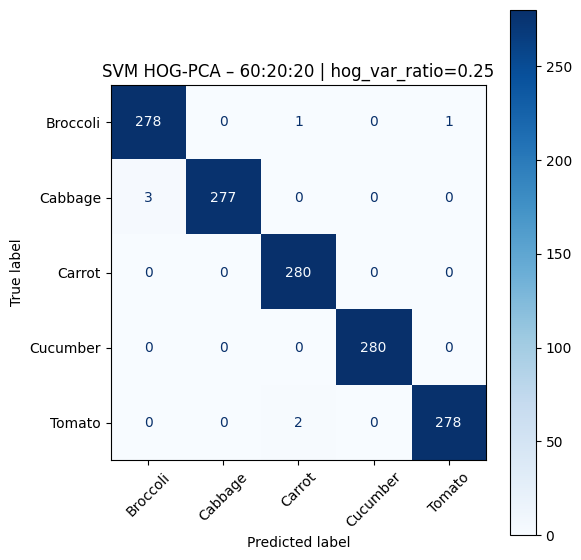


[HOG-PCA] Split 60:20:20 (tag=60_20_20) | hog_var_ratio=0.5
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 308 fitur   (varian HOG terjaga 50.05%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4200, 375)
    Val  : (1400, 375)
    Test : (1400, 375)
  Total dimensi setelah HOG-PCA + gabung: 375 fitur

>>> Grid Search SVM (HOG-PCA) | Split 60:20:20 | hog_var_ratio=0.5

Top-3 config SVM untuk kombinasi ini:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
9,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,5.5,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
10,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,6.0,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
11,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,6.5,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
12,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,7.0,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
13,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,7.5,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
14,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,8.0,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
15,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,8.5,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
16,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,9.0,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
17,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,9.5,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286
18,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.5,50.050499,308,10.0,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286


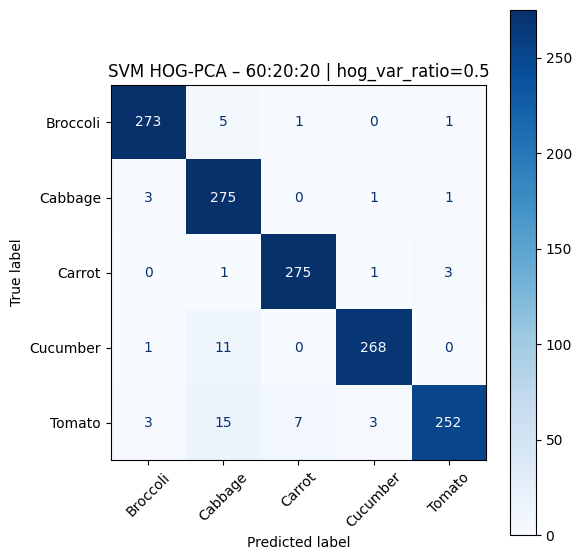


   SVM-HOG | Split: 70:15:15  (tag=70_15_15)

[HOG-PCA] Split 70:15:15 (tag=70_15_15) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 49 fitur   (varian HOG terjaga 25.18%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4899, 116)
    Val  : (1050, 116)
    Test : (1051, 116)
  Total dimensi setelah HOG-PCA + gabung: 116 fitur

>>> Grid Search SVM (HOG-PCA) | Split 70:15:15 | hog_var_ratio=0.25

Top-3 config SVM untuk kombinasi ini:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
14,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,8.0,...,1.000000,1.000000,0.996190,0.996199,0.996262,0.996190,0.994291,0.994286,0.994295,0.994290
15,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,8.5,...,1.000000,1.000000,0.996190,0.996199,0.996262,0.996190,0.994291,0.994286,0.994295,0.994290
16,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,9.0,...,1.000000,1.000000,0.996190,0.996199,0.996262,0.996190,0.994291,0.994286,0.994295,0.994290
17,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,9.5,...,1.000000,1.000000,0.996190,0.996199,0.996262,0.996190,0.994291,0.994286,0.994295,0.994290
18,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,10.0,...,1.000000,1.000000,0.996190,0.996199,0.996262,0.996190,0.994291,0.994286,0.994295,0.994290
2,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,2.0,...,0.999389,0.999388,0.995238,0.995243,0.995252,0.995238,0.993340,0.993329,0.993338,0.993338
3,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,2.5,...,0.999593,0.999592,0.995238,0.995243,0.995261,0.995238,0.993340,0.993329,0.993338,0.993338
4,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,3.0,...,0.999593,0.999592,0.995238,0.995243,0.995261,0.995238,0.993340,0.993329,0.993338,0.993338
7,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,4.5,...,0.999796,0.999796,0.996190,0.996199,0.996262,0.996190,0.993340,0.993326,0.993337,0.993338
8,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,5.0,...,0.999796,0.999796,0.996190,0.996199,0.996262,0.996190,0.993340,0.993326,0.993337,0.993338


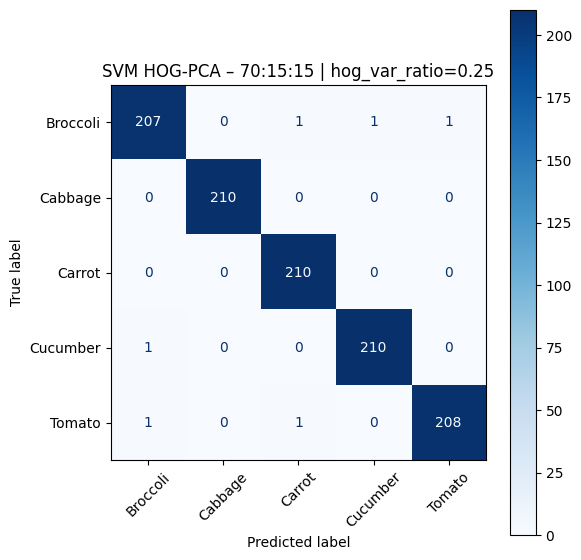


[HOG-PCA] Split 70:15:15 (tag=70_15_15) | hog_var_ratio=0.5
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 319 fitur   (varian HOG terjaga 50.00%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4899, 386)
    Val  : (1050, 386)
    Test : (1051, 386)
  Total dimensi setelah HOG-PCA + gabung: 386 fitur

>>> Grid Search SVM (HOG-PCA) | Split 70:15:15 | hog_var_ratio=0.5

Top-3 config SVM untuk kombinasi ini:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
5,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,3.5,...,0.999796,0.999796,0.980952,0.980966,0.981164,0.980952,0.974310,0.974325,0.974603,0.974317
6,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,4.0,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317
7,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,4.5,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317
8,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,5.0,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317
9,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,5.5,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317
10,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,6.0,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317
11,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,6.5,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317
12,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,7.0,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317
13,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,7.5,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317
14,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.5,50.004566,319,8.0,...,1.000000,1.000000,0.980952,0.980966,0.981164,0.980952,0.974310,0.974315,0.974523,0.974317


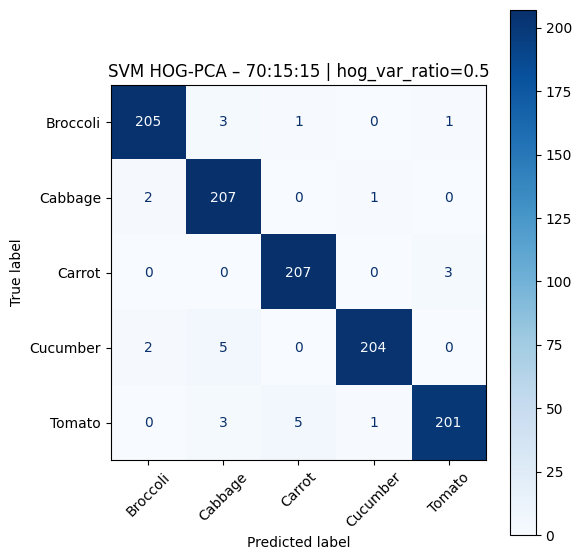


   SVM-HOG | Split: 80:10:10  (tag=80_10_10)

[HOG-PCA] Split 80:10:10 (tag=80_10_10) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 49 fitur   (varian HOG terjaga 25.11%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (5600, 116)
    Val  : (700, 116)
    Test : (700, 116)
  Total dimensi setelah HOG-PCA + gabung: 116 fitur

>>> Grid Search SVM (HOG-PCA) | Split 80:10:10 | hog_var_ratio=0.25

Top-3 config SVM untuk kombinasi ini:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
15,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,8.5,...,1.000000,1.000000,0.992857,0.992862,0.992926,0.992857,0.991429,0.991428,0.991498,0.991429
16,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,9.0,...,1.000000,1.000000,0.992857,0.992862,0.992926,0.992857,0.991429,0.991428,0.991498,0.991429
17,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,9.5,...,1.000000,1.000000,0.992857,0.992862,0.992926,0.992857,0.991429,0.991428,0.991498,0.991429
18,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,10.0,...,1.000000,1.000000,0.992857,0.992862,0.992926,0.992857,0.991429,0.991428,0.991498,0.991429
3,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,2.5,...,0.999643,0.999643,0.992857,0.992862,0.992926,0.992857,0.990000,0.989989,0.990049,0.990000
2,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,2.0,...,0.999643,0.999643,0.992857,0.992847,0.992877,0.992857,0.990000,0.989989,0.990049,0.990000
4,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,3.0,...,0.999643,0.999643,0.994286,0.994286,0.994316,0.994286,0.990000,0.989984,0.990059,0.990000
5,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,3.5,...,0.999643,0.999643,0.992857,0.992862,0.992926,0.992857,0.990000,0.989984,0.990059,0.990000
6,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,4.0,...,0.999822,0.999821,0.992857,0.992862,0.992926,0.992857,0.990000,0.989984,0.990059,0.990000
7,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.25,25.108168,49,4.5,...,0.999822,0.999821,0.992857,0.992862,0.992926,0.992857,0.990000,0.989984,0.990059,0.990000


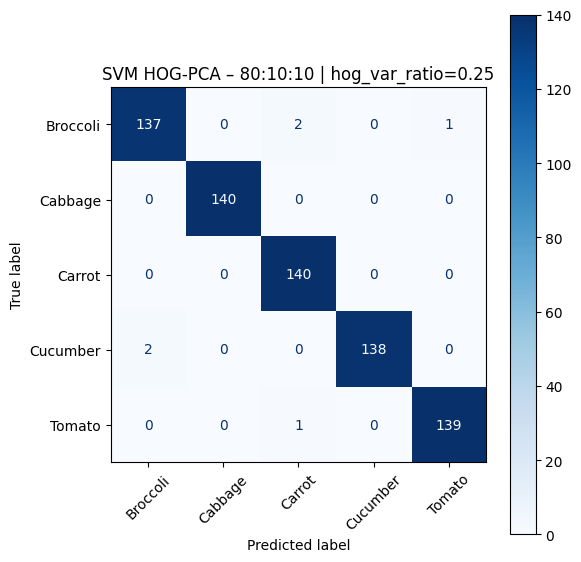


[HOG-PCA] Split 80:10:10 (tag=80_10_10) | hog_var_ratio=0.5
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 330 fitur   (varian HOG terjaga 50.03%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (5600, 397)
    Val  : (700, 397)
    Test : (700, 397)
  Total dimensi setelah HOG-PCA + gabung: 397 fitur

>>> Grid Search SVM (HOG-PCA) | Split 80:10:10 | hog_var_ratio=0.5

Top-3 config SVM untuk kombinasi ini:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
5,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,3.5,...,0.999822,0.999821,0.970000,0.970007,0.970880,0.970000,0.974286,0.974304,0.974481,0.974286
6,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,4.0,...,1.000000,1.000000,0.970000,0.970007,0.970880,0.970000,0.974286,0.974304,0.974481,0.974286
7,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,4.5,...,1.000000,1.000000,0.970000,0.970007,0.970880,0.970000,0.974286,0.974304,0.974481,0.974286
8,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,5.0,...,1.000000,1.000000,0.970000,0.970007,0.970880,0.970000,0.974286,0.974304,0.974481,0.974286
9,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,5.5,...,1.000000,1.000000,0.970000,0.970007,0.970880,0.970000,0.974286,0.974304,0.974481,0.974286
10,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,6.0,...,1.000000,1.000000,0.968571,0.968621,0.969635,0.968571,0.974286,0.974304,0.974481,0.974286
11,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,6.5,...,1.000000,1.000000,0.968571,0.968621,0.969635,0.968571,0.974286,0.974304,0.974481,0.974286
12,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,7.0,...,1.000000,1.000000,0.968571,0.968621,0.969635,0.968571,0.974286,0.974304,0.974481,0.974286
13,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,7.5,...,1.000000,1.000000,0.968571,0.968621,0.969635,0.968571,0.974286,0.974304,0.974481,0.974286
14,SVM,80_10_10,80:10:10,0.8,0.1,0.1,0.5,50.034107,330,8.0,...,1.000000,1.000000,0.968571,0.968621,0.969635,0.968571,0.974286,0.974304,0.974481,0.974286


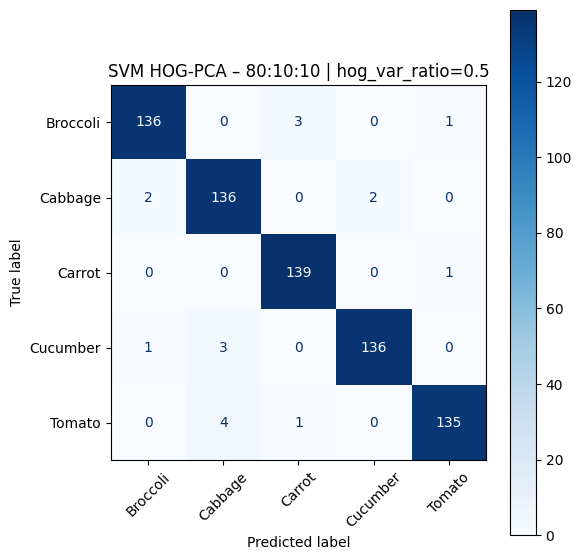


   SVM-HOG | Split: 90:5:5  (tag=90_5_5)

[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 50 fitur   (varian HOG terjaga 25.19%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 117)
    Val  : (350, 117)
    Test : (350, 117)
  Total dimensi setelah HOG-PCA + gabung: 117 fitur

>>> Grid Search SVM (HOG-PCA) | Split 90:5:5 | hog_var_ratio=0.25

Top-3 config SVM untuk kombinasi ini:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
1,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,1.5,...,0.998574,0.998571,0.997143,0.997143,0.997183,0.997143,0.994286,0.994285,0.994366,0.994286
2,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,2.0,...,0.999207,0.999206,0.997143,0.997143,0.997183,0.997143,0.994286,0.994285,0.994366,0.994286
3,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,2.5,...,0.999524,0.999524,0.997143,0.997143,0.997183,0.997143,0.994286,0.994285,0.994366,0.994286
10,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,6.0,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994286,0.994265,0.994366,0.994286
11,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,6.5,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994286,0.994265,0.994366,0.994286
12,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,7.0,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994286,0.994265,0.994366,0.994286
13,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,7.5,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994286,0.994265,0.994366,0.994286
14,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,8.0,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994286,0.994265,0.994366,0.994286
15,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,8.5,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994286,0.994265,0.994366,0.994286
16,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,9.0,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.994286,0.994265,0.994366,0.994286


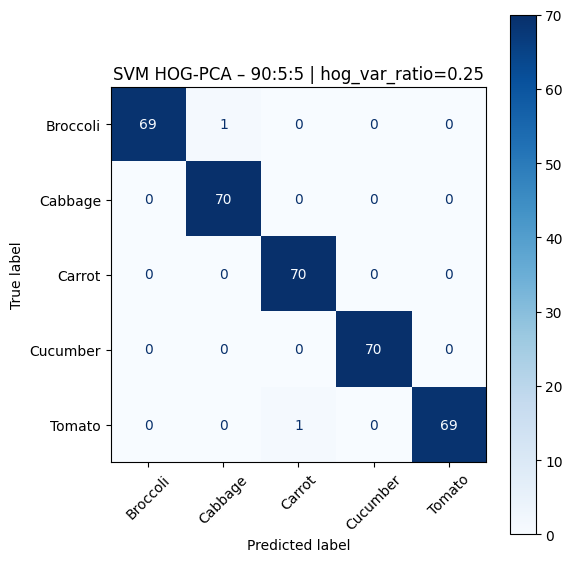


[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.5
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 339 fitur   (varian HOG terjaga 50.00%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 406)
    Val  : (350, 406)
    Test : (350, 406)
  Total dimensi setelah HOG-PCA + gabung: 406 fitur

>>> Grid Search SVM (HOG-PCA) | Split 90:5:5 | hog_var_ratio=0.5

Top-3 config SVM untuk kombinasi ini:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
5,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,3.5,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
6,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,4.0,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
7,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,4.5,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
8,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,5.0,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
9,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,5.5,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
10,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,6.0,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
11,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,6.5,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
12,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,7.0,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
13,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,7.5,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
14,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.5,50.004982,339,8.0,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000


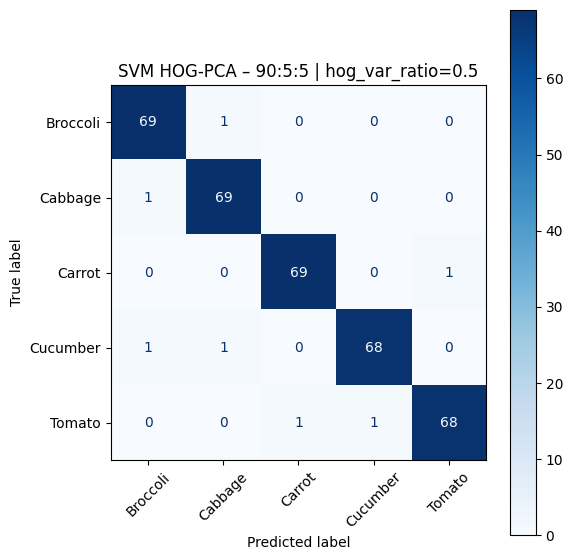


=== Ringkasan SVM dengan HOG-PCA (semua split & rasio) ===


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
0,SVM,60_20_20,60:20:20,0.6,0.20,0.20,0.25,25.082386,48,4.5,...,0.999762,0.999762,0.993571,0.993580,0.993627,0.993571,0.995000,0.995001,0.995028,0.995000
2,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,8.0,...,1.000000,1.000000,0.996190,0.996199,0.996262,0.996190,0.994291,0.994286,0.994295,0.994290
6,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,1.5,...,0.998574,0.998571,0.997143,0.997143,0.997183,0.997143,0.994286,0.994285,0.994366,0.994286
4,SVM,80_10_10,80:10:10,0.8,0.10,0.10,0.25,25.108168,49,8.5,...,1.000000,1.000000,0.992857,0.992862,0.992926,0.992857,0.991429,0.991428,0.991498,0.991429
7,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.50,50.004982,339,3.5,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
3,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.50,50.004566,319,3.5,...,0.999796,0.999796,0.980952,0.980966,0.981164,0.980952,0.974310,0.974325,0.974603,0.974317
5,SVM,80_10_10,80:10:10,0.8,0.10,0.10,0.50,50.034107,330,3.5,...,0.999822,0.999821,0.970000,0.970007,0.970880,0.970000,0.974286,0.974304,0.974481,0.974286
1,SVM,60_20_20,60:20:20,0.6,0.20,0.20,0.50,50.050499,308,5.5,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286



✓ SVM-HOG: ringkasan & model terbaik disimpan ke:
  - /content/model_svm_hog_pca/svm_hog_pca_best_configs_per_split_ratio.csv
  - /content/model_svm_hog_pca/svm_hog_pca_best_models.pkl


In [ ]:
# ============================================================
# Cell 10 – SVM Experiments with HOG-PCA (schema diseragamkan)
#   - HOG variance ratios: 25%, 50%, 75%, 90%
#   - 4 split: 60:20:20, 70:15:15, 80:10:10, 90:5:5
#   - Simpan semua metrik & best model per kombinasi
# ============================================================
from sklearn.base import clone
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

print("\n--- Cell 10: SVM dengan HOG-PCA pada 4 split & beberapa rasio ---")

# Rasio varian HOG yang diuji (PCA pada HOG saja)
HOG_VAR_RATIOS = [0.25, 0.50]

# Split yang dipakai (harus sudah ada di SPLITS)
split_tags_to_run = ["60_20_20", "70_15_15", "80_10_10", "90_5_5"]

svm_hog_results_rows = []   # kumpulan baris hasil terbaik per kombinasi (split, hog_ratio)
svm_hog_best_models = {}    # simpan model terbaik per (split, hog_ratio)


def _compute_metrics_full(y_true, y_pred, tag):
    """Utility kecil untuk menghasilkan dict metrik Train_/Val_/Test_ lengkap."""
    return {
        f"{tag}_acc":  accuracy_score(y_true, y_pred),
        f"{tag}_f1":   f1_score(y_true, y_pred, average="macro"),
        f"{tag}_prec": precision_score(y_true, y_pred, average="macro", zero_division=0),
        f"{tag}_rec":  recall_score(y_true, y_pred, average="macro", zero_division=0),
    }


for split_tag in split_tags_to_run:
    info_split = SPLITS[split_tag]
    split_name = info_split["name"]
    print(f"\n======================================")
    print(f"   SVM-HOG | Split: {split_name}  (tag={split_tag})")
    print(f"======================================")

    for hog_ratio in HOG_VAR_RATIOS:
        # Bangun pipeline HOG-PCA + gabung fitur untuk split & rasio ini
        pipe = build_hog_pca_pipeline_from_split(
            split_tag=split_tag,
            hog_var_ratio=hog_ratio,
            random_state=SEED
        )

        X_tr = pipe["X_train"]; y_tr = pipe["y_train"]
        X_va = pipe["X_val"];   y_va = pipe["y_val"]
        X_te = pipe["X_test"];  y_te = pipe["y_test"]

        print(f"\n>>> Grid Search SVM (HOG-PCA) | Split {split_name} | hog_var_ratio={hog_ratio}")
        grid_rows = []

        # grid_search_configs sudah didefinisikan di bagian SVM sebelumnya
        for cfg in grid_search_configs:
            model = clone(cfg["model"])
            C_val = cfg["C"]
            gamma_val = cfg["Gamma"]

            model.fit(X_tr, y_tr)

            y_pred_tr = model.predict(X_tr)
            y_pred_va = model.predict(X_va)
            y_pred_te = model.predict(X_te)

            # Hitung metrik lengkap
            m_tr = _compute_metrics_full(y_tr, y_pred_tr, "Train")
            m_va = _compute_metrics_full(y_va, y_pred_va, "Val")
            m_te = _compute_metrics_full(y_te, y_pred_te, "Test")

            row = {
                "Model_Type": "SVM",
                "Split_Tag": split_tag,
                "Split_Name": split_name,
                "train_ratio": info_split["train_ratio"],
                "val_ratio":   info_split["val_ratio"],
                "test_ratio":  info_split["test_ratio"],
                "hog_var_ratio": float(hog_ratio),
                "hog_explained_variance": float(pipe["hog_explained_variance"]),
                "hog_n_components": int(pipe["hog_n_components"]),
                "C": float(C_val),
                "Gamma": gamma_val,
            }
            row.update(m_tr)
            row.update(m_va)
            row.update(m_te)
            grid_rows.append(row)

        df_grid = pd.DataFrame(grid_rows)
        df_grid_sorted = df_grid.sort_values(
            by=["Test_f1", "Val_f1"],
            ascending=False
        )

        print("\nTop-3 config SVM untuk kombinasi ini:")
        display(df_grid_sorted)

        # Ambil konfigurasi terbaik (berdasarkan Test_f1 lalu Val_f1)
        best_row = df_grid_sorted.iloc[0]
        best_C = best_row["C"]
        best_gamma = best_row["Gamma"]

        # Latih ulang model terbaik untuk disimpan (supaya konsisten dengan best_row)
        best_model = SVC(
            kernel="rbf",
            C=float(best_C),
            gamma=best_gamma,
            random_state=SEED,
            probability=False,
            cache_size=500
        )
        best_model.fit(X_tr, y_tr)

        y_pred_best = best_model.predict(X_te)
        cm = confusion_matrix(y_te, y_pred_best)

        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
        fig, ax = plt.subplots(figsize=(6, 6))
        disp.plot(ax=ax, cmap="Blues", xticks_rotation=45)
        plt.title(f"SVM HOG-PCA – {split_name} | hog_var_ratio={hog_ratio}")
        plt.tight_layout()
        plt.show()

        key = f"{split_tag}_hog{int(hog_ratio*100)}"
        svm_hog_best_models[key] = {
            "model_type": "SVM",
            "split_tag": split_tag,
            "split_name": split_name,
            "train_ratio": info_split["train_ratio"],
            "val_ratio":   info_split["val_ratio"],
            "test_ratio":  info_split["test_ratio"],
            "hog_var_ratio": float(hog_ratio),
            "hog_explained_variance": float(pipe["hog_explained_variance"]),
            "hog_n_components": int(pipe["hog_n_components"]),
            "dim_summary": pipe["dim_summary"],   # ringkasan dimensi masing-masing fitur
            "C": float(best_C),
            "Gamma": best_gamma,
            "model": best_model,
            "scalers": pipe["scalers"],          # dict scaler per blok fitur
            "hog_pca": pipe["hog_pca"],          # objek PCA khusus HOG
        }

        # Simpan baris best_row (sudah berisi metrik & meta)
        svm_hog_results_rows.append(dict(best_row))

# Buat DataFrame global SVM-HOG
df_svm_hog_results = pd.DataFrame(svm_hog_results_rows)
df_svm_hog_results_sorted = df_svm_hog_results.sort_values(
    by=["Test_f1", "Val_f1"],
    ascending=False
)

print("\n=== Ringkasan SVM dengan HOG-PCA (semua split & rasio) ===")
display(df_svm_hog_results_sorted.head(20))

# Simpan ke disk
svm_hog_csv = MODEL_SVM_DIR / "svm_hog_pca_best_configs_per_split_ratio.csv"
svm_hog_pkl = MODEL_SVM_DIR / "svm_hog_pca_best_models.pkl"

df_svm_hog_results_sorted.to_csv(svm_hog_csv, index=False)
joblib.dump(svm_hog_best_models, svm_hog_pkl)

print("\n✓ SVM-HOG: ringkasan & model terbaik disimpan ke:")
print("  -", svm_hog_csv)
print("  -", svm_hog_pkl)


## 11. kNN Experiments with HOG-PCA


--- Cell 11: kNN dengan HOG-PCA pada 4 split & beberapa rasio ---

   kNN-HOG | Split: 60:20:20  (tag=60_20_20)

[HOG-PCA] Split 60:20:20 (tag=60_20_20) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 48 fitur   (varian HOG terjaga 25.08%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4200, 115)
    Val  : (1400, 115)
    Test : (1400, 115)
  Total dimensi setelah HOG-PCA + gabung: 115 fitur

>>> kNN-HOG | Split 60:20:20 | hog_var_ratio=0.25
Fitting 3 folds for each of 14 candidates, totalling 42 fits

=== Grid Search kNN selesai ===
Best params : {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Best CV F1  : 0.9792413216491876

=== Evaluasi kNN untuk split 60:20:20 | HOG-PCA(0.25) ===
Train → Acc=1.0000 | F1_macro=1.0000 | Prec_macro=1.0000 | Rec_macro=1.0000
Val → Acc=0.9886 | F1_macro=0.9885 | Prec_macro=0.9888 | Rec_macro=0.9886
Test → Acc=0.9843 | F1_macro=0.9842 | Prec_macro=0.9844 | Rec_macro=0.9843

--- Classification Repo

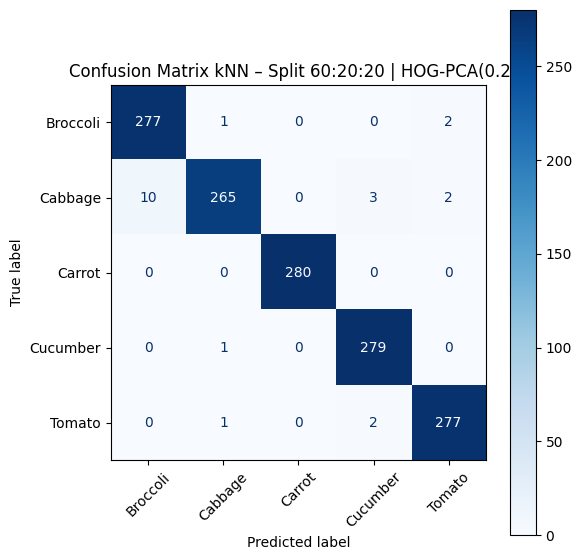


Tabel lengkap semua konfigurasi kNN untuk kombinasi ini:


,param_n_neighbors,param_weights,param_metric,mean_test_score,std_test_score,rank_test_score
0,1,uniform,euclidean,0.979241,0.004066,1
1,1,distance,euclidean,0.979241,0.004066,1
5,5,distance,euclidean,0.972327,0.002331,3
3,3,distance,euclidean,0.970861,0.000602,4
7,7,distance,euclidean,0.969300,0.002016,5
4,5,uniform,euclidean,0.967371,0.001609,6
2,3,uniform,euclidean,0.966841,0.000799,7
9,9,distance,euclidean,0.966669,0.003678,8
11,11,distance,euclidean,0.964568,0.004194,9
6,7,uniform,euclidean,0.963868,0.003837,10



[HOG-PCA] Split 60:20:20 (tag=60_20_20) | hog_var_ratio=0.5
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 308 fitur   (varian HOG terjaga 50.05%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4200, 375)
    Val  : (1400, 375)
    Test : (1400, 375)
  Total dimensi setelah HOG-PCA + gabung: 375 fitur

>>> kNN-HOG | Split 60:20:20 | hog_var_ratio=0.5
Fitting 3 folds for each of 14 candidates, totalling 42 fits

=== Grid Search kNN selesai ===
Best params : {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Best CV F1  : 0.8124307390789229

=== Evaluasi kNN untuk split 60:20:20 | HOG-PCA(0.5) ===
Train → Acc=1.0000 | F1_macro=1.0000 | Prec_macro=1.0000 | Rec_macro=1.0000
Val → Acc=0.8250 | F1_macro=0.8191 | Prec_macro=0.8583 | Rec_macro=0.8250
Test → Acc=0.8200 | F1_macro=0.8149 | Prec_macro=0.8550 | Rec_macro=0.8200

--- Classification Report (Test) ---
              precision    recall  f1-score   support

    Broccoli       0.70      0.98      0.81   

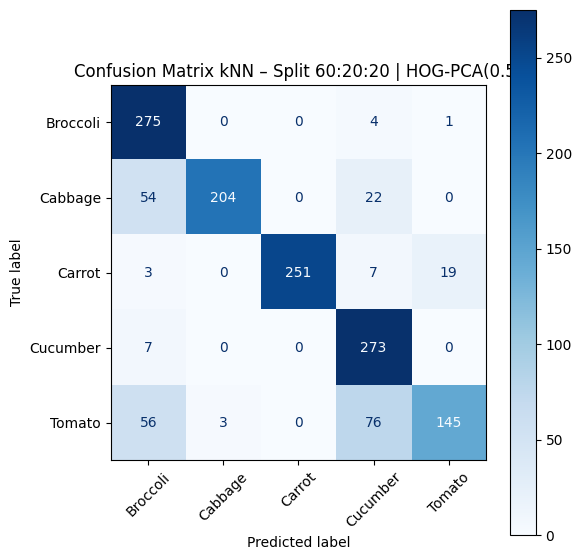


Tabel lengkap semua konfigurasi kNN untuk kombinasi ini:


,param_n_neighbors,param_weights,param_metric,mean_test_score,std_test_score,rank_test_score
0,1,uniform,euclidean,0.812431,0.021329,1
1,1,distance,euclidean,0.812431,0.021329,1
3,3,distance,euclidean,0.783250,0.024301,3
5,5,distance,euclidean,0.748720,0.028147,4
2,3,uniform,euclidean,0.737097,0.029702,5
7,7,distance,euclidean,0.727514,0.024293,6
9,9,distance,euclidean,0.705643,0.027203,7
4,5,uniform,euclidean,0.701790,0.026441,8
11,11,distance,euclidean,0.679431,0.025018,9
6,7,uniform,euclidean,0.670551,0.029476,10



   kNN-HOG | Split: 70:15:15  (tag=70_15_15)

[HOG-PCA] Split 70:15:15 (tag=70_15_15) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 49 fitur   (varian HOG terjaga 25.18%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4899, 116)
    Val  : (1050, 116)
    Test : (1051, 116)
  Total dimensi setelah HOG-PCA + gabung: 116 fitur

>>> kNN-HOG | Split 70:15:15 | hog_var_ratio=0.25
Fitting 3 folds for each of 14 candidates, totalling 42 fits

=== Grid Search kNN selesai ===
Best params : {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Best CV F1  : 0.9844504472303686

=== Evaluasi kNN untuk split 70:15:15 | HOG-PCA(0.25) ===
Train → Acc=1.0000 | F1_macro=1.0000 | Prec_macro=1.0000 | Rec_macro=1.0000
Val → Acc=0.9886 | F1_macro=0.9885 | Prec_macro=0.9888 | Rec_macro=0.9886
Test → Acc=0.9857 | F1_macro=0.9857 | Prec_macro=0.9858 | Rec_macro=0.9857

--- Classification Report (Test) ---
              precision    recall  f1-score   support

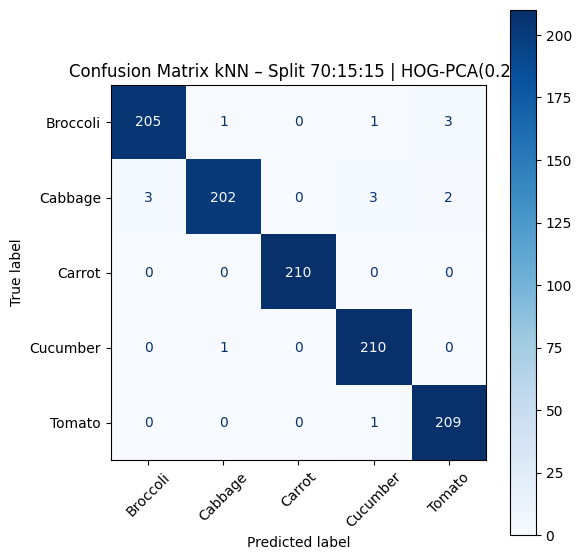


Tabel lengkap semua konfigurasi kNN untuk kombinasi ini:


,param_n_neighbors,param_weights,param_metric,mean_test_score,std_test_score,rank_test_score
0,1,uniform,euclidean,0.984450,0.002385,1
1,1,distance,euclidean,0.984450,0.002385,1
3,3,distance,euclidean,0.978346,0.002918,3
2,3,uniform,euclidean,0.977123,0.003578,4
5,5,distance,euclidean,0.975717,0.004325,5
7,7,distance,euclidean,0.974314,0.003495,6
4,5,uniform,euclidean,0.971861,0.005405,7
11,11,distance,euclidean,0.969866,0.004034,8
9,9,distance,euclidean,0.969422,0.005697,9
6,7,uniform,euclidean,0.969008,0.004534,10



[HOG-PCA] Split 70:15:15 (tag=70_15_15) | hog_var_ratio=0.5
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 319 fitur   (varian HOG terjaga 50.00%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4899, 386)
    Val  : (1050, 386)
    Test : (1051, 386)
  Total dimensi setelah HOG-PCA + gabung: 386 fitur

>>> kNN-HOG | Split 70:15:15 | hog_var_ratio=0.5
Fitting 3 folds for each of 14 candidates, totalling 42 fits

=== Grid Search kNN selesai ===
Best params : {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Best CV F1  : 0.8370527491118583

=== Evaluasi kNN untuk split 70:15:15 | HOG-PCA(0.5) ===
Train → Acc=1.0000 | F1_macro=1.0000 | Prec_macro=1.0000 | Rec_macro=1.0000
Val → Acc=0.8486 | F1_macro=0.8461 | Prec_macro=0.8766 | Rec_macro=0.8486
Test → Acc=0.8544 | F1_macro=0.8518 | Prec_macro=0.8842 | Rec_macro=0.8543

--- Classification Report (Test) ---
              precision    recall  f1-score   support

    Broccoli       0.73      0.98      0.83   

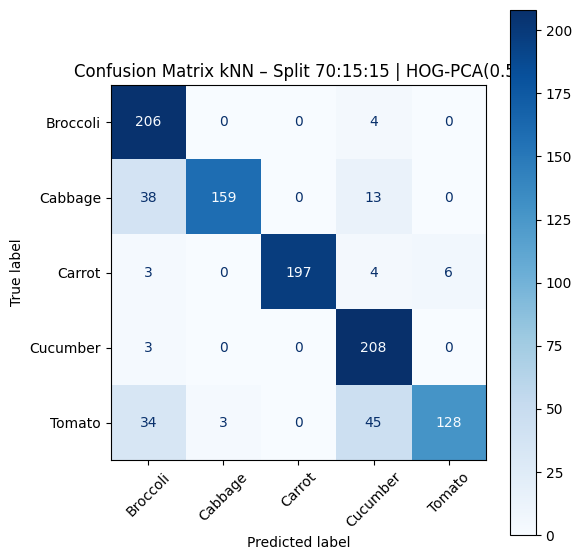


Tabel lengkap semua konfigurasi kNN untuk kombinasi ini:


,param_n_neighbors,param_weights,param_metric,mean_test_score,std_test_score,rank_test_score
0,1,uniform,euclidean,0.837053,0.013157,1
1,1,distance,euclidean,0.837053,0.013157,1
3,3,distance,euclidean,0.807150,0.011335,3
5,5,distance,euclidean,0.773284,0.013069,4
2,3,uniform,euclidean,0.766310,0.014210,5
7,7,distance,euclidean,0.740608,0.017409,6
4,5,uniform,euclidean,0.724453,0.015581,7
9,9,distance,euclidean,0.717540,0.019392,8
6,7,uniform,euclidean,0.694415,0.017141,9
11,11,distance,euclidean,0.693896,0.020830,10



   kNN-HOG | Split: 80:10:10  (tag=80_10_10)

[HOG-PCA] Split 80:10:10 (tag=80_10_10) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 49 fitur   (varian HOG terjaga 25.11%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (5600, 116)
    Val  : (700, 116)
    Test : (700, 116)
  Total dimensi setelah HOG-PCA + gabung: 116 fitur

>>> kNN-HOG | Split 80:10:10 | hog_var_ratio=0.25
Fitting 3 folds for each of 14 candidates, totalling 42 fits

=== Grid Search kNN selesai ===
Best params : {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Best CV F1  : 0.9830044944580737

=== Evaluasi kNN untuk split 80:10:10 | HOG-PCA(0.25) ===
Train → Acc=1.0000 | F1_macro=1.0000 | Prec_macro=1.0000 | Rec_macro=1.0000
Val → Acc=0.9914 | F1_macro=0.9914 | Prec_macro=0.9915 | Rec_macro=0.9914
Test → Acc=0.9857 | F1_macro=0.9857 | Prec_macro=0.9861 | Rec_macro=0.9857

--- Classification Report (Test) ---
              precision    recall  f1-score   support



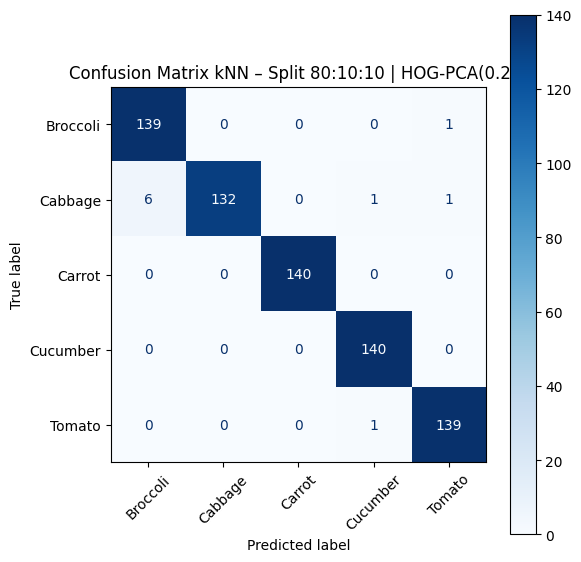


Tabel lengkap semua konfigurasi kNN untuk kombinasi ini:


,param_n_neighbors,param_weights,param_metric,mean_test_score,std_test_score,rank_test_score
0,1,uniform,euclidean,0.983004,0.002679,1
1,1,distance,euclidean,0.983004,0.002679,1
3,3,distance,euclidean,0.979973,0.004849,3
2,3,uniform,euclidean,0.977468,0.004865,4
5,5,distance,euclidean,0.976750,0.003705,5
7,7,distance,euclidean,0.974464,0.003889,6
4,5,uniform,euclidean,0.972458,0.002826,7
9,9,distance,euclidean,0.971781,0.004764,8
6,7,uniform,euclidean,0.970552,0.002693,9
11,11,distance,euclidean,0.969304,0.007082,10



[HOG-PCA] Split 80:10:10 (tag=80_10_10) | hog_var_ratio=0.5
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 330 fitur   (varian HOG terjaga 50.03%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (5600, 397)
    Val  : (700, 397)
    Test : (700, 397)
  Total dimensi setelah HOG-PCA + gabung: 397 fitur

>>> kNN-HOG | Split 80:10:10 | hog_var_ratio=0.5
Fitting 3 folds for each of 14 candidates, totalling 42 fits

=== Grid Search kNN selesai ===
Best params : {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Best CV F1  : 0.8392892521736625

=== Evaluasi kNN untuk split 80:10:10 | HOG-PCA(0.5) ===
Train → Acc=1.0000 | F1_macro=1.0000 | Prec_macro=1.0000 | Rec_macro=1.0000
Val → Acc=0.8429 | F1_macro=0.8399 | Prec_macro=0.8697 | Rec_macro=0.8429
Test → Acc=0.8757 | F1_macro=0.8749 | Prec_macro=0.9000 | Rec_macro=0.8757

--- Classification Report (Test) ---
              precision    recall  f1-score   support

    Broccoli       0.76      0.99      0.86     

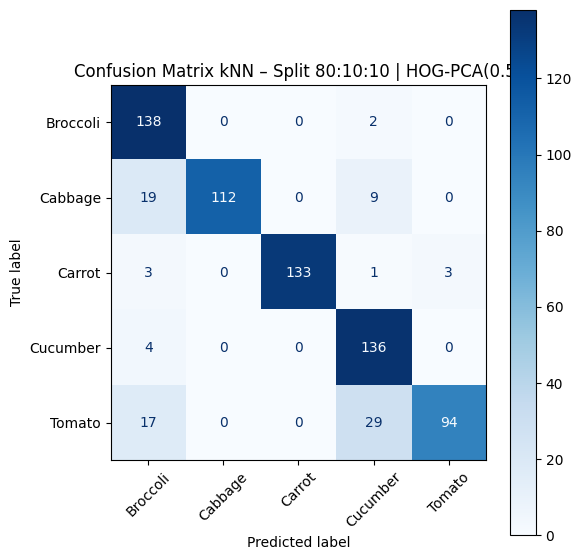


Tabel lengkap semua konfigurasi kNN untuk kombinasi ini:


,param_n_neighbors,param_weights,param_metric,mean_test_score,std_test_score,rank_test_score
0,1,uniform,euclidean,0.839289,0.002488,1
1,1,distance,euclidean,0.839289,0.002488,1
3,3,distance,euclidean,0.813875,0.005458,3
5,5,distance,euclidean,0.793617,0.004343,4
2,3,uniform,euclidean,0.779961,0.004919,5
7,7,distance,euclidean,0.768047,0.006094,6
4,5,uniform,euclidean,0.747779,0.009300,7
9,9,distance,euclidean,0.736972,0.009365,8
6,7,uniform,euclidean,0.714945,0.009591,9
11,11,distance,euclidean,0.712841,0.010923,10



   kNN-HOG | Split: 90:5:5  (tag=90_5_5)

[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 50 fitur   (varian HOG terjaga 25.19%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 117)
    Val  : (350, 117)
    Test : (350, 117)
  Total dimensi setelah HOG-PCA + gabung: 117 fitur

>>> kNN-HOG | Split 90:5:5 | hog_var_ratio=0.25
Fitting 3 folds for each of 14 candidates, totalling 42 fits

=== Grid Search kNN selesai ===
Best params : {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Best CV F1  : 0.9839316946639846

=== Evaluasi kNN untuk split 90:5:5 | HOG-PCA(0.25) ===
Train → Acc=1.0000 | F1_macro=1.0000 | Prec_macro=1.0000 | Rec_macro=1.0000
Val → Acc=0.9971 | F1_macro=0.9971 | Prec_macro=0.9972 | Rec_macro=0.9971
Test → Acc=0.9886 | F1_macro=0.9885 | Prec_macro=0.9890 | Rec_macro=0.9886

--- Classification Report (Test) ---
              precision    recall  f1-score   support

    Broccoli

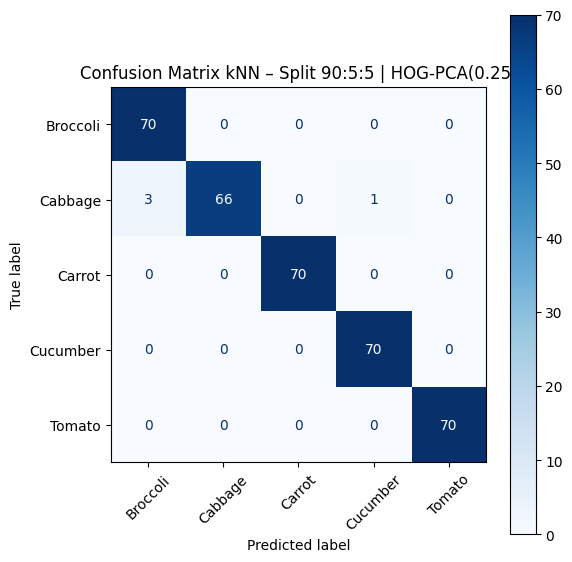


Tabel lengkap semua konfigurasi kNN untuk kombinasi ini:


,param_n_neighbors,param_weights,param_metric,mean_test_score,std_test_score,rank_test_score
0,1,uniform,euclidean,0.983932,0.002211,1
1,1,distance,euclidean,0.983932,0.002211,1
3,3,distance,euclidean,0.980595,0.002857,3
2,3,uniform,euclidean,0.979968,0.003014,4
5,5,distance,euclidean,0.979329,0.002366,5
7,7,distance,euclidean,0.978210,0.002913,6
9,9,distance,euclidean,0.976805,0.002439,7
4,5,uniform,euclidean,0.976800,0.002575,8
6,7,uniform,euclidean,0.974406,0.002123,9
13,13,distance,euclidean,0.973335,0.002355,10



[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.5
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 339 fitur   (varian HOG terjaga 50.00%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 406)
    Val  : (350, 406)
    Test : (350, 406)
  Total dimensi setelah HOG-PCA + gabung: 406 fitur

>>> kNN-HOG | Split 90:5:5 | hog_var_ratio=0.5
Fitting 3 folds for each of 14 candidates, totalling 42 fits

=== Grid Search kNN selesai ===
Best params : {'metric': 'euclidean', 'n_neighbors': 1, 'weights': 'uniform'}
Best CV F1  : 0.8529761484155602

=== Evaluasi kNN untuk split 90:5:5 | HOG-PCA(0.5) ===
Train → Acc=1.0000 | F1_macro=1.0000 | Prec_macro=1.0000 | Rec_macro=1.0000
Val → Acc=0.8857 | F1_macro=0.8818 | Prec_macro=0.9087 | Rec_macro=0.8857
Test → Acc=0.8629 | F1_macro=0.8604 | Prec_macro=0.8888 | Rec_macro=0.8629

--- Classification Report (Test) ---
              precision    recall  f1-score   support

    Broccoli       0.75      0.96      0.84        70
  

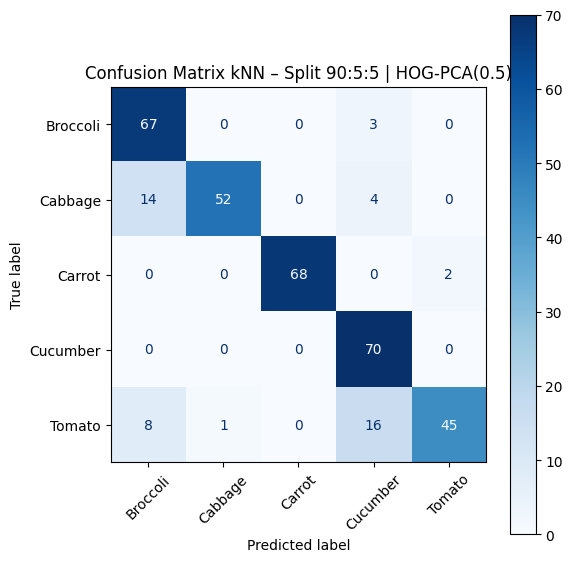


Tabel lengkap semua konfigurasi kNN untuk kombinasi ini:


,param_n_neighbors,param_weights,param_metric,mean_test_score,std_test_score,rank_test_score
0,1,uniform,euclidean,0.852976,0.009002,1
1,1,distance,euclidean,0.852976,0.009002,1
3,3,distance,euclidean,0.831010,0.009495,3
5,5,distance,euclidean,0.807511,0.010281,4
2,3,uniform,euclidean,0.798617,0.011901,5
7,7,distance,euclidean,0.777711,0.009103,6
4,5,uniform,euclidean,0.763563,0.016869,7
9,9,distance,euclidean,0.749196,0.006531,8
6,7,uniform,euclidean,0.730352,0.012420,9
11,11,distance,euclidean,0.725731,0.004732,10



=== Ringkasan kNN dengan HOG-PCA (semua split & rasio) ===


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,n_neighbors,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
6,kNN,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,1,...,1.0,1.0,0.997143,0.997143,0.997183,0.997143,0.988571,0.988503,0.988964,0.988571
2,kNN,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,1,...,1.0,1.0,0.988571,0.988512,0.988844,0.988571,0.985728,0.985694,0.985831,0.985719
4,kNN,80_10_10,80:10:10,0.8,0.10,0.10,0.25,25.108168,49,1,...,1.0,1.0,0.991429,0.991412,0.991529,0.991429,0.985714,0.985652,0.986070,0.985714
0,kNN,60_20_20,60:20:20,0.6,0.20,0.20,0.25,25.082386,48,1,...,1.0,1.0,0.988571,0.988538,0.988762,0.988571,0.984286,0.984222,0.984424,0.984286
5,kNN,80_10_10,80:10:10,0.8,0.10,0.10,0.50,50.034107,330,1,...,1.0,1.0,0.842857,0.839915,0.869733,0.842857,0.875714,0.874871,0.899973,0.875714
7,kNN,90_5_5,90:5:5,0.9,0.05,0.05,0.50,50.004982,339,1,...,1.0,1.0,0.885714,0.881819,0.908677,0.885714,0.862857,0.860386,0.888815,0.862857
3,kNN,70_15_15,70:15:15,0.7,0.15,0.15,0.50,50.004566,319,1,...,1.0,1.0,0.848571,0.846088,0.876583,0.848571,0.854424,0.851765,0.884236,0.854299
1,kNN,60_20_20,60:20:20,0.6,0.20,0.20,0.50,50.050499,308,1,...,1.0,1.0,0.825000,0.819063,0.858324,0.825000,0.820000,0.814888,0.855031,0.820000



✓ kNN-HOG: ringkasan & model terbaik disimpan ke:
  - /content/model_knn_hog_pca/knn_hog_pca_results_all_splits_ratios.csv
  - /content/model_knn_hog_pca/knn_hog_pca_best_models.pkl


In [ ]:
# ============================================================
# Cell 11 – kNN Experiments with HOG-PCA (schema sama dgn SVM)
# ============================================================
print("\n--- Cell 11: kNN dengan HOG-PCA pada 4 split & beberapa rasio ---")

knn_hog_results_rows = []
knn_hog_best_models = {}

for split_tag in split_tags_to_run:
    info_split = SPLITS[split_tag]
    split_name = info_split["name"]
    print(f"\n======================================")
    print(f"   kNN-HOG | Split: {split_name}  (tag={split_tag})")
    print(f"======================================")

    for hog_ratio in HOG_VAR_RATIOS:
        pipe = build_hog_pca_pipeline_from_split(
            split_tag=split_tag,
            hog_var_ratio=hog_ratio,
            random_state=SEED
        )

        X_tr = pipe["X_train"]; y_tr = pipe["y_train"]
        X_va = pipe["X_val"];   y_va = pipe["y_val"]
        X_te = pipe["X_test"];  y_te = pipe["y_test"]

        print(f"\n>>> kNN-HOG | Split {split_name} | hog_var_ratio={hog_ratio}")

        # Grid Search kNN
        best_knn, grid_obj = run_knn_grid_search(X_tr, y_tr, cv_splits=3)

        # Evaluasi train/val/test
        metrics = evaluate_knn_model(
            best_knn,
            X_tr, y_tr,
            X_va, y_va,
            X_te, y_te,
            split_name=f"{split_name} | HOG-PCA({hog_ratio})"
        )

        # Tabel semua kombinasi kNN (CV)
        cv_df = pd.DataFrame(grid_obj.cv_results_)
        cols_show = [
            "param_n_neighbors", "param_weights", "param_metric",
            "mean_test_score", "std_test_score", "rank_test_score"
        ]
        cv_df_show = cv_df[cols_show].sort_values("mean_test_score", ascending=False)

        print("\nTabel lengkap semua konfigurasi kNN untuk kombinasi ini:")
        display(cv_df_show)

        # Simpan model terbaik per kombinasi (split, hog_ratio)
        key = f"{split_tag}_hog{int(hog_ratio*100)}"
        knn_hog_best_models[key] = {
            "model_type": "kNN",
            "split_tag": split_tag,
            "split_name": split_name,
            "train_ratio": info_split["train_ratio"],
            "val_ratio":   info_split["val_ratio"],
            "test_ratio":  info_split["test_ratio"],
            "hog_var_ratio": float(hog_ratio),
            "hog_explained_variance": float(pipe["hog_explained_variance"]),
            "hog_n_components": int(pipe["hog_n_components"]),
            "dim_summary": pipe["dim_summary"],
            "best_params": grid_obj.best_params_,
            "best_cv_f1":  float(grid_obj.best_score_),
            "model": best_knn,
            "scalers": pipe["scalers"],
            "hog_pca": pipe["hog_pca"],
        }

        # Baris untuk tabel ringkasan kNN-HOG
        row = {
            "Model_Type": "kNN",
            "Split_Tag": split_tag,
            "Split_Name": split_name,
            "train_ratio": info_split["train_ratio"],
            "val_ratio":   info_split["val_ratio"],
            "test_ratio":  info_split["test_ratio"],
            "hog_var_ratio": float(hog_ratio),
            "hog_explained_variance": float(pipe["hog_explained_variance"]),
            "hog_n_components": int(pipe["hog_n_components"]),
            "n_neighbors": grid_obj.best_params_["n_neighbors"],
            "weights": grid_obj.best_params_["weights"],
            "metric": grid_obj.best_params_["metric"],
            "best_cv_f1": float(grid_obj.best_score_),
        }
        # tambahkan Train_acc, Val_acc, Test_acc, dst.
        row.update(metrics)
        knn_hog_results_rows.append(row)

# DataFrame ringkasan
df_knn_hog_results = pd.DataFrame(knn_hog_results_rows)
df_knn_hog_results_sorted = df_knn_hog_results.sort_values(
    by=["Test_f1", "Val_f1"],
    ascending=False
)

print("\n=== Ringkasan kNN dengan HOG-PCA (semua split & rasio) ===")
display(df_knn_hog_results_sorted.head(20))

knn_hog_csv = MODEL_KNN_DIR / "knn_hog_pca_results_all_splits_ratios.csv"
knn_hog_pkl = MODEL_KNN_DIR / "knn_hog_pca_best_models.pkl"

df_knn_hog_results_sorted.to_csv(knn_hog_csv, index=False)
joblib.dump(knn_hog_best_models, knn_hog_pkl)

print("\n✓ kNN-HOG: ringkasan & model terbaik disimpan ke:")
print("  -", knn_hog_csv)
print("  -", knn_hog_pkl)


## XGBoost Experiments with HOG-PCA (dengan semua metrik)

In [ ]:
# ============================================================
# Cell 12 – XGBoost Experiments with HOG-PCA
# ============================================================
print("\n--- Cell 12: XGBoost + Optuna dengan HOG-PCA pada 4 split & beberapa rasio ---")

xgb_hog_results_rows = []
xgb_hog_best_models = {}

# Bisa dinaikkan kalau runtime kuat
N_TRIALS_XGB_HOG = 15

for split_tag in split_tags_to_run:
    info_split = SPLITS[split_tag]
    split_name = info_split["name"]
    print(f"\n======================================")
    print(f"   XGBoost-HOG | Split: {split_name}  (tag={split_tag})")
    print(f"======================================")

    for hog_ratio in HOG_VAR_RATIOS:
        pipe = build_hog_pca_pipeline_from_split(
            split_tag=split_tag,
            hog_var_ratio=hog_ratio,
            random_state=SEED
        )

        X_tr = pipe["X_train"]; y_tr = pipe["y_train"]
        X_va = pipe["X_val"];   y_va = pipe["y_val"]
        X_te = pipe["X_test"];  y_te = pipe["y_test"]

        print(f"\n>>> XGB-HOG + Optuna | Split {split_name} | hog_var_ratio={hog_ratio}")

        study_name = f"xgb_hog_{split_tag}_{int(hog_ratio*100)}"

        # Optuna tuning
        best_xgb, best_params, study = tune_xgb_with_optuna(
            X_tr, y_tr,
            X_va, y_va,
            n_trials=N_TRIALS_XGB_HOG,
            study_name=study_name,
            random_state=SEED
        )

        # Evaluasi Train / Val / Test
        metrics = evaluate_xgb_model(
            best_xgb,
            X_tr, y_tr,
            X_va, y_va,
            X_te, y_te,
            split_name=f"{split_name} | HOG-PCA({hog_ratio})"
        )

        df_trials = study.trials_dataframe(attrs=("number", "value", "params"))
        df_trials_sorted = df_trials.sort_values("value", ascending=False)

        print("\nTabel lengkap semua konfigurasi XGBoost (Optuna trials) untuk kombinasi ini:")
        display(df_trials_sorted)


        key = f"{split_tag}_hog{int(hog_ratio*100)}"
        xgb_hog_best_models[key] = {
            "model_type": "XGBoost",
            "split_tag": split_tag,
            "split_name": split_name,
            "train_ratio": info_split["train_ratio"],
            "val_ratio":   info_split["val_ratio"],
            "test_ratio":  info_split["test_ratio"],
            "hog_var_ratio": float(hog_ratio),
            "hog_explained_variance": float(pipe["hog_explained_variance"]),
            "hog_n_components": int(pipe["hog_n_components"]),
            "dim_summary": pipe["dim_summary"],
            "best_params": best_params,
            "best_val_f1_optuna": float(study.best_value),
            "model":  best_xgb,
            "scalers": pipe["scalers"],
            "hog_pca": pipe["hog_pca"],
        }

        row = {
            "Model_Type": "XGBoost",
            "Split_Tag": split_tag,
            "Split_Name": split_name,
            "train_ratio": info_split["train_ratio"],
            "val_ratio":   info_split["val_ratio"],
            "test_ratio":  info_split["test_ratio"],
            "hog_var_ratio": float(hog_ratio),
            "hog_explained_variance": float(pipe["hog_explained_variance"]),
            "hog_n_components": int(pipe["hog_n_components"]),
            "best_params": best_params,
            "best_val_f1_optuna": float(study.best_value),
        }
        row.update(metrics)
        xgb_hog_results_rows.append(row)

df_xgb_hog_results = pd.DataFrame(xgb_hog_results_rows)
df_xgb_hog_results_sorted = df_xgb_hog_results.sort_values(
    by=["Test_f1", "Val_f1"],
    ascending=False
)

print("\n=== Ringkasan XGBoost dengan HOG-PCA (semua split & rasio) ===")
display(df_xgb_hog_results_sorted[
    [
        "Model_Type","Split_Tag","Split_Name","hog_var_ratio",
        "Train_acc","Val_acc","Test_acc",
        "Train_f1","Val_f1","Test_f1"
    ]
])

xgb_hog_csv = MODEL_XGB_DIR / "xgb_hog_pca_results_all_splits_ratios.csv"
xgb_hog_pkl = MODEL_XGB_DIR / "xgb_hog_pca_best_models.pkl"

df_xgb_hog_results_sorted.to_csv(xgb_hog_csv, index=False)
joblib.dump(xgb_hog_best_models, xgb_hog_pkl)

print("\n✓ XGB-HOG: ringkasan & model terbaik disimpan ke:")
print("  -", xgb_hog_csv)
print("  -", xgb_hog_pkl)


--- Cell 12: XGBoost + Optuna dengan HOG-PCA pada 4 split & beberapa rasio ---

   XGBoost-HOG | Split: 60:20:20  (tag=60_20_20)

[HOG-PCA] Split 60:20:20 (tag=60_20_20) | hog_var_ratio=0.25


[I 2025-12-06 22:24:14,291] A new study created in memory with name: xgb_hog_60_20_20_25


  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 48 fitur   (varian HOG terjaga 25.08%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4200, 115)
    Val  : (1400, 115)
    Test : (1400, 115)
  Total dimensi setelah HOG-PCA + gabung: 115 fitur

>>> XGB-HOG + Optuna | Split 60:20:20 | hog_var_ratio=0.25

>>> Menjalankan Optuna Study: xgb_hog_60_20_20_25 | n_trials=15


  0%|          | 0/15 [00:00<?, ?it/s]

[I 2025-12-06 22:24:16,923] Trial 0 finished with value: 0.9864050332287804 and parameters: {'n_estimators': 100, 'max_depth': 6, 'learning_rate': 0.1943474782011309, 'subsample': 0.8325045815664207, 'colsample_bytree': 0.8468713163420959, 'min_child_weight': 4, 'gamma': 3.3479215369010666, 'reg_lambda': 0.016514814776937742, 'reg_alpha': 0.09154410434784377}. Best is trial 0 with value: 0.9864050332287804.
[I 2025-12-06 22:24:27,502] Trial 1 finished with value: 0.9885606401025406 and parameters: {'n_estimators': 300, 'max_depth': 4, 'learning_rate': 0.05294068093391068, 'subsample': 0.7093772565501557, 'colsample_bytree': 0.9737350010214534, 'min_child_weight': 1, 'gamma': 2.051924434283112, 'reg_lambda': 0.04051715272934037, 'reg_alpha': 0.019314673755873816}. Best is trial 1 with value: 0.9885606401025406.
[I 2025-12-06 22:24:33,697] Trial 2 finished with value: 0.9806530299208284 and parameters: {'n_estimators': 300, 'max_depth': 6, 'learning_rate': 0.08363508950154028, 'subsample

,number,value,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
10,10,0.996423,0.607572,0.133512,0.088614,8,7,400,0.010745,0.103173,0.769579
11,11,0.995714,0.607825,0.111673,0.081286,8,7,400,0.010133,0.084296,0.776724
12,12,0.994996,0.605940,0.045813,0.061373,8,7,400,0.040731,0.144361,0.761206
13,13,0.994996,0.621217,0.145699,0.073507,8,7,400,0.010914,0.057536,0.624757
14,14,0.994278,0.680958,1.149649,0.130807,8,6,350,0.037277,0.236806,0.667501
6,6,0.992129,0.690913,1.565954,0.105175,4,1,350,0.011188,0.094630,0.808539
8,8,0.989978,0.915602,1.855135,0.297025,6,5,150,0.129354,0.454949,0.723438
4,4,0.989276,0.739771,2.087185,0.030184,6,1,250,0.087690,4.911108,0.982320
1,1,0.988561,0.973735,2.051924,0.052941,4,1,300,0.019315,0.040517,0.709377
3,3,0.988552,0.902508,2.252796,0.036969,3,3,400,0.297403,0.826183,0.600916



[HOG-PCA] Split 60:20:20 (tag=60_20_20) | hog_var_ratio=0.5


[I 2025-12-06 22:29:06,584] A new study created in memory with name: xgb_hog_60_20_20_50


  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 308 fitur   (varian HOG terjaga 50.05%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4200, 375)
    Val  : (1400, 375)
    Test : (1400, 375)
  Total dimensi setelah HOG-PCA + gabung: 375 fitur

>>> XGB-HOG + Optuna | Split 60:20:20 | hog_var_ratio=0.5

>>> Menjalankan Optuna Study: xgb_hog_60_20_20_50 | n_trials=15


  0%|          | 0/15 [00:00<?, ?it/s]

[I 2025-12-06 22:29:38,204] Trial 0 finished with value: 0.9863990358496573 and parameters: {'n_estimators': 350, 'max_depth': 3, 'learning_rate': 0.06584228227215565, 'subsample': 0.6643484719087567, 'colsample_bytree': 0.9861923901977951, 'min_child_weight': 1, 'gamma': 2.0965075706426344, 'reg_lambda': 0.10510356262884017, 'reg_alpha': 0.6331633634445464}. Best is trial 0 with value: 0.9863990358496573.
[I 2025-12-06 22:29:52,042] Trial 1 finished with value: 0.9806452461443612 and parameters: {'n_estimators': 250, 'max_depth': 3, 'learning_rate': 0.16910751438674382, 'subsample': 0.9183609332965519, 'colsample_bytree': 0.806210594213611, 'min_child_weight': 6, 'gamma': 3.6676682518572408, 'reg_lambda': 0.15706844072841747, 'reg_alpha': 0.2615340795582213}. Best is trial 0 with value: 0.9863990358496573.
[I 2025-12-06 22:30:19,762] Trial 2 finished with value: 0.9835157487133044 and parameters: {'n_estimators': 350, 'max_depth': 8, 'learning_rate': 0.12858632973939782, 'subsample': 

,number,value,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
13,13,0.994994,0.640819,0.106319,0.067271,6,4,150,0.923767,1.683130,0.970616
12,12,0.993565,0.712849,1.124989,0.062093,6,4,200,0.374999,0.016921,0.604544
7,7,0.990703,0.966351,1.036708,0.121626,4,5,150,0.576360,0.178400,0.602294
4,4,0.988561,0.697861,1.949312,0.048838,5,4,250,0.366262,0.031115,0.628682
0,0,0.986399,0.986192,2.096508,0.065842,3,1,350,0.633163,0.105104,0.664348
6,6,0.983539,0.939245,3.697167,0.225265,7,3,200,0.220032,0.555891,0.774711
3,3,0.983536,0.843824,2.941105,0.095121,5,7,150,0.996432,0.085314,0.880210
2,2,0.983516,0.911317,3.162735,0.128586,8,1,350,0.074599,8.726263,0.698651
14,14,0.983514,0.612286,0.062672,0.030859,6,3,150,0.982574,1.980126,0.815999
11,11,0.980660,0.708594,1.366215,0.039299,5,4,100,0.408149,0.718549,0.615608



   XGBoost-HOG | Split: 70:15:15  (tag=70_15_15)

[HOG-PCA] Split 70:15:15 (tag=70_15_15) | hog_var_ratio=0.25


[I 2025-12-06 22:39:04,923] A new study created in memory with name: xgb_hog_70_15_15_25


  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 49 fitur   (varian HOG terjaga 25.18%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4899, 116)
    Val  : (1050, 116)
    Test : (1051, 116)
  Total dimensi setelah HOG-PCA + gabung: 116 fitur

>>> XGB-HOG + Optuna | Split 70:15:15 | hog_var_ratio=0.25

>>> Menjalankan Optuna Study: xgb_hog_70_15_15_25 | n_trials=15


  0%|          | 0/15 [00:00<?, ?it/s]

[I 2025-12-06 22:39:16,623] Trial 0 finished with value: 0.9799495515061025 and parameters: {'n_estimators': 350, 'max_depth': 5, 'learning_rate': 0.040473151815583204, 'subsample': 0.7801200197722274, 'colsample_bytree': 0.8585997515775121, 'min_child_weight': 3, 'gamma': 4.981057038830773, 'reg_lambda': 5.208406586153947, 'reg_alpha': 0.05937080741520785}. Best is trial 0 with value: 0.9799495515061025.
[I 2025-12-06 22:39:35,456] Trial 1 finished with value: 0.9876143831740665 and parameters: {'n_estimators': 150, 'max_depth': 7, 'learning_rate': 0.03586733601388518, 'subsample': 0.8642813483101945, 'colsample_bytree': 0.9256922003216136, 'min_child_weight': 2, 'gamma': 0.6972235862608, 'reg_lambda': 0.0933068148537501, 'reg_alpha': 0.0869518801858309}. Best is trial 1 with value: 0.9876143831740665.
[I 2025-12-06 22:39:40,920] Trial 2 finished with value: 0.9856936668682227 and parameters: {'n_estimators': 400, 'max_depth': 5, 'learning_rate': 0.22751802374786206, 'subsample': 0.99

,number,value,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
12,12,0.991424,0.989532,0.129940,0.030643,8,2,150,0.332439,0.011320,0.861859
14,14,0.991415,0.840365,1.046079,0.134158,6,3,150,0.279207,0.013260,0.909696
11,11,0.990467,0.990601,0.093559,0.036790,8,2,100,0.182914,0.049565,0.883758
1,1,0.987614,0.925692,0.697224,0.035867,7,2,150,0.086952,0.093307,0.864281
10,10,0.987605,0.999597,0.095725,0.035196,8,2,100,0.166097,0.057913,0.880883
3,3,0.987567,0.769490,1.840611,0.210960,6,5,200,0.748699,0.365874,0.657003
5,5,0.986648,0.667498,1.329560,0.053414,3,6,200,0.023930,7.831297,0.669888
13,13,0.986646,0.997259,0.186562,0.030925,8,2,100,0.312799,0.010112,0.848973
6,6,0.985703,0.710511,3.998182,0.054824,7,7,300,0.756915,1.093615,0.971651
2,2,0.985694,0.933172,3.038993,0.227518,5,4,400,0.036545,0.670738,0.993895



[HOG-PCA] Split 70:15:15 (tag=70_15_15) | hog_var_ratio=0.5


[I 2025-12-06 22:45:23,959] A new study created in memory with name: xgb_hog_70_15_15_50


  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 319 fitur   (varian HOG terjaga 50.00%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4899, 386)
    Val  : (1050, 386)
    Test : (1051, 386)
  Total dimensi setelah HOG-PCA + gabung: 386 fitur

>>> XGB-HOG + Optuna | Split 70:15:15 | hog_var_ratio=0.5

>>> Menjalankan Optuna Study: xgb_hog_70_15_15_50 | n_trials=15


  0%|          | 0/15 [00:00<?, ?it/s]

[I 2025-12-06 22:45:38,724] Trial 0 finished with value: 0.9837750492239141 and parameters: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.21145591329669278, 'subsample': 0.8657160224452798, 'colsample_bytree': 0.8251475371640922, 'min_child_weight': 6, 'gamma': 3.3832549106221683, 'reg_lambda': 0.13400753604953416, 'reg_alpha': 0.06155210769745239}. Best is trial 0 with value: 0.9837750492239141.
[I 2025-12-06 22:46:10,866] Trial 1 finished with value: 0.9799656620228101 and parameters: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.05552212061497257, 'subsample': 0.9552218138507923, 'colsample_bytree': 0.787474105440257, 'min_child_weight': 2, 'gamma': 4.7017077824298585, 'reg_lambda': 7.355364872889889, 'reg_alpha': 0.022293694485932256}. Best is trial 0 with value: 0.9837750492239141.
[I 2025-12-06 22:46:45,491] Trial 2 finished with value: 0.9875821519327357 and parameters: {'n_estimators': 350, 'max_depth': 7, 'learning_rate': 0.07012671988565826, 'subsample':

,number,value,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
3,3,0.990455,0.815553,0.623500,0.200500,8,6,150,0.959349,1.915762,0.934396
12,12,0.988546,0.715981,1.154461,0.144157,8,5,100,0.968191,2.790471,0.992823
14,14,0.988534,0.710621,1.165391,0.147891,8,7,150,0.576628,1.849888,0.943234
10,10,0.988532,0.607574,0.029949,0.291764,8,5,100,0.943375,4.284103,0.913943
2,2,0.987582,0.772954,2.092070,0.070127,7,7,350,0.395831,0.022599,0.798582
11,11,0.987573,0.627565,0.146074,0.293334,8,6,100,0.992897,4.959023,0.919368
8,8,0.987565,0.995170,0.687305,0.197473,6,3,250,0.041740,0.619724,0.753158
13,13,0.986621,0.712221,1.198251,0.125768,8,5,150,0.499612,1.941062,0.999016
9,9,0.985710,0.726070,1.860290,0.225575,6,3,350,0.178559,0.957373,0.624806
0,0,0.983775,0.825148,3.383255,0.211456,7,6,200,0.061552,0.134008,0.865716



   XGBoost-HOG | Split: 80:10:10  (tag=80_10_10)

[HOG-PCA] Split 80:10:10 (tag=80_10_10) | hog_var_ratio=0.25


[I 2025-12-06 22:55:49,898] A new study created in memory with name: xgb_hog_80_10_10_25


  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 49 fitur   (varian HOG terjaga 25.11%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (5600, 116)
    Val  : (700, 116)
    Test : (700, 116)
  Total dimensi setelah HOG-PCA + gabung: 116 fitur

>>> XGB-HOG + Optuna | Split 80:10:10 | hog_var_ratio=0.25

>>> Menjalankan Optuna Study: xgb_hog_80_10_10_25 | n_trials=15


  0%|          | 0/15 [00:00<?, ?it/s]

[I 2025-12-06 22:56:00,438] Trial 0 finished with value: 0.9857527775347739 and parameters: {'n_estimators': 350, 'max_depth': 4, 'learning_rate': 0.057676804312579946, 'subsample': 0.9234807301299874, 'colsample_bytree': 0.9626680303027455, 'min_child_weight': 6, 'gamma': 1.519328742333499, 'reg_lambda': 4.057024202182026, 'reg_alpha': 0.04268747395373728}. Best is trial 0 with value: 0.9857527775347739.
[I 2025-12-06 22:56:14,768] Trial 1 finished with value: 0.9885809015147767 and parameters: {'n_estimators': 400, 'max_depth': 7, 'learning_rate': 0.04923093520905762, 'subsample': 0.600505477125804, 'colsample_bytree': 0.9875121841202174, 'min_child_weight': 4, 'gamma': 1.9884720856786975, 'reg_lambda': 0.11541452503021743, 'reg_alpha': 0.11419221681746211}. Best is trial 1 with value: 0.9885809015147767.
[I 2025-12-06 22:56:21,554] Trial 2 finished with value: 0.9829168983551352 and parameters: {'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.08299742949641843, 'subsample': 

,number,value,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
11,11,0.994291,0.854293,0.125562,0.138564,6,7,250,0.882796,1.072226,0.714017
9,9,0.992867,0.943242,0.329556,0.040746,8,6,350,0.062318,5.635351,0.695152
13,13,0.992862,0.894471,0.892420,0.130943,5,6,300,0.132452,1.623011,0.635449
10,10,0.992852,0.850975,0.324279,0.132559,6,7,250,0.641286,0.932451,0.717199
12,12,0.992852,0.860649,0.039442,0.274558,6,7,250,0.994642,9.930397,0.754367
8,8,0.990014,0.904539,0.503538,0.169802,8,4,150,0.016451,0.086113,0.804267
14,14,0.990005,0.816678,0.969437,0.062215,7,6,200,0.241088,2.062413,0.998456
1,1,0.988581,0.987512,1.988472,0.049231,7,4,400,0.114192,0.115415,0.600505
6,6,0.988581,0.605231,1.604334,0.042805,8,5,300,0.014274,0.014562,0.925684
7,7,0.987177,0.717498,2.334282,0.091091,3,3,400,0.021033,1.080061,0.821212



[HOG-PCA] Split 80:10:10 (tag=80_10_10) | hog_var_ratio=0.5


[I 2025-12-06 23:02:55,649] A new study created in memory with name: xgb_hog_80_10_10_50


  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 330 fitur   (varian HOG terjaga 50.03%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (5600, 397)
    Val  : (700, 397)
    Test : (700, 397)
  Total dimensi setelah HOG-PCA + gabung: 397 fitur

>>> XGB-HOG + Optuna | Split 80:10:10 | hog_var_ratio=0.5

>>> Menjalankan Optuna Study: xgb_hog_80_10_10_50 | n_trials=15


  0%|          | 0/15 [00:00<?, ?it/s]

[I 2025-12-06 23:03:28,142] Trial 0 finished with value: 0.987156518568049 and parameters: {'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.05741762424304027, 'subsample': 0.861507569203372, 'colsample_bytree': 0.8374816378721386, 'min_child_weight': 4, 'gamma': 1.9463423203529129, 'reg_lambda': 0.24241878048900148, 'reg_alpha': 0.4756868688705226}. Best is trial 0 with value: 0.987156518568049.
[I 2025-12-06 23:03:59,773] Trial 1 finished with value: 0.9857316060712382 and parameters: {'n_estimators': 300, 'max_depth': 5, 'learning_rate': 0.10209235880711484, 'subsample': 0.7249262620849003, 'colsample_bytree': 0.7197443773580083, 'min_child_weight': 1, 'gamma': 2.135740820268624, 'reg_lambda': 1.8212719739951813, 'reg_alpha': 0.18152737152080106}. Best is trial 0 with value: 0.987156518568049.
[I 2025-12-06 23:04:21,980] Trial 2 finished with value: 0.9900048644358534 and parameters: {'n_estimators': 250, 'max_depth': 8, 'learning_rate': 0.22852867380097452, 'subsample': 0.74

,number,value,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
11,11,0.994300,0.921663,0.226933,0.281598,6,5,200,0.376926,0.013787,0.802124
12,12,0.991438,0.914968,0.028077,0.286282,7,5,200,0.051647,0.066189,0.785936
13,13,0.990014,0.921051,0.077946,0.287080,6,5,150,0.783696,0.010438,0.866538
7,7,0.990005,0.866364,1.483362,0.074950,5,7,300,0.293005,0.010284,0.848629
2,2,0.990005,0.862423,0.667028,0.228529,8,4,250,0.043096,1.239412,0.748409
10,10,0.988590,0.980340,0.128152,0.246673,7,2,200,0.983030,0.478434,0.996885
8,8,0.988581,0.964530,1.191905,0.144776,5,4,200,0.042812,3.140809,0.611654
9,9,0.987177,0.842233,1.423118,0.043762,3,7,300,0.018082,0.975103,0.603330
0,0,0.987157,0.837482,1.946342,0.057418,3,4,300,0.475687,0.242419,0.861508
5,5,0.987157,0.642383,2.029391,0.032661,8,6,350,0.044696,9.306915,0.925460



   XGBoost-HOG | Split: 90:5:5  (tag=90_5_5)

[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.25


[I 2025-12-06 23:16:16,050] A new study created in memory with name: xgb_hog_90_5_5_25


  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 50 fitur   (varian HOG terjaga 25.19%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 117)
    Val  : (350, 117)
    Test : (350, 117)
  Total dimensi setelah HOG-PCA + gabung: 117 fitur

>>> XGB-HOG + Optuna | Split 90:5:5 | hog_var_ratio=0.25

>>> Menjalankan Optuna Study: xgb_hog_90_5_5_25 | n_trials=15


  0%|          | 0/15 [00:00<?, ?it/s]

[I 2025-12-06 23:16:25,485] Trial 0 finished with value: 0.9943054007498227 and parameters: {'n_estimators': 300, 'max_depth': 7, 'learning_rate': 0.09012158592513796, 'subsample': 0.9024172071778827, 'colsample_bytree': 0.9846167166761515, 'min_child_weight': 6, 'gamma': 1.3649850696085375, 'reg_lambda': 1.4422918947192376, 'reg_alpha': 0.9206591842825769}. Best is trial 0 with value: 0.9943054007498227.
[I 2025-12-06 23:16:29,108] Trial 1 finished with value: 0.9857536586425025 and parameters: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.2869738542988787, 'subsample': 0.6955350044517368, 'colsample_bytree': 0.6858904525139929, 'min_child_weight': 4, 'gamma': 2.1258508919297423, 'reg_lambda': 0.03744711157065994, 'reg_alpha': 0.02370344094231691}. Best is trial 0 with value: 0.9943054007498227.
[I 2025-12-06 23:16:37,352] Trial 2 finished with value: 0.9858127484026765 and parameters: {'n_estimators': 400, 'max_depth': 7, 'learning_rate': 0.17890482186130954, 'subsample': 

,number,value,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
13,13,0.997143,0.936980,0.053107,0.031628,8,5,350,0.350940,9.706630,0.983255
12,12,0.997143,0.997066,0.060182,0.039980,7,5,350,0.383618,2.879957,0.945930
10,10,0.997143,0.941501,0.159481,0.031089,8,6,400,0.992340,9.176024,0.885259
11,11,0.994305,0.980165,0.108032,0.031751,8,6,400,0.970057,9.248367,0.888028
0,0,0.994305,0.984617,1.364985,0.090122,7,6,300,0.920659,1.442292,0.902417
4,4,0.994305,0.615568,1.281941,0.098943,5,2,300,0.018018,0.791307,0.932763
14,14,0.994305,0.937538,0.658176,0.047318,6,5,400,0.147425,2.963259,0.827903
9,9,0.991488,0.850178,1.668114,0.125996,8,7,250,0.617506,0.202990,0.751265
3,3,0.988631,0.709514,1.663761,0.060847,5,3,200,0.274788,0.328453,0.652871
8,8,0.988631,0.643970,3.567454,0.144237,7,6,300,0.016720,0.012811,0.860552



[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.5


[I 2025-12-06 23:26:06,163] A new study created in memory with name: xgb_hog_90_5_5_50


  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 339 fitur   (varian HOG terjaga 50.00%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 406)
    Val  : (350, 406)
    Test : (350, 406)
  Total dimensi setelah HOG-PCA + gabung: 406 fitur

>>> XGB-HOG + Optuna | Split 90:5:5 | hog_var_ratio=0.5

>>> Menjalankan Optuna Study: xgb_hog_90_5_5_50 | n_trials=15


  0%|          | 0/15 [00:00<?, ?it/s]

[I 2025-12-06 23:27:15,969] Trial 0 finished with value: 0.9886681958780802 and parameters: {'n_estimators': 300, 'max_depth': 8, 'learning_rate': 0.030553833672019477, 'subsample': 0.8495529146184999, 'colsample_bytree': 0.8705879039286698, 'min_child_weight': 6, 'gamma': 3.1881024636303437, 'reg_lambda': 0.18605164038936306, 'reg_alpha': 0.6907688754494773}. Best is trial 0 with value: 0.9886681958780802.
[I 2025-12-06 23:27:46,874] Trial 1 finished with value: 0.9716069335776181 and parameters: {'n_estimators': 100, 'max_depth': 4, 'learning_rate': 0.035405211640000225, 'subsample': 0.6914239514535649, 'colsample_bytree': 0.8381871573145707, 'min_child_weight': 2, 'gamma': 2.9482538550912496, 'reg_lambda': 0.27070541917314145, 'reg_alpha': 0.23067619811502665}. Best is trial 0 with value: 0.9886681958780802.
[I 2025-12-06 23:28:00,865] Trial 2 finished with value: 0.9857918955197654 and parameters: {'n_estimators': 150, 'max_depth': 4, 'learning_rate': 0.1680935971228942, 'subsample

,number,value,params_colsample_bytree,params_gamma,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample
12,12,0.997143,0.730303,0.271027,0.288046,5,1,200,0.016328,7.125287,0.763970
13,13,0.997143,0.755502,0.060958,0.104553,6,1,200,0.012605,8.517007,0.766342
14,14,0.997143,0.920723,0.968066,0.272235,6,2,250,0.030797,1.356105,0.644679
11,11,0.997143,0.740192,0.110154,0.296689,6,1,200,0.014559,9.212076,0.600067
10,10,0.997143,0.747136,0.308439,0.286010,6,1,200,0.010613,6.415878,0.760901
6,6,0.991467,0.766486,1.159120,0.230741,7,2,200,0.015782,2.532173,0.631005
5,5,0.988668,0.808055,4.887313,0.044167,7,4,400,0.636237,0.028018,0.981825
0,0,0.988668,0.870588,3.188102,0.030554,8,6,300,0.690769,0.186052,0.849553
9,9,0.988631,0.948462,3.302172,0.064168,3,5,300,0.055255,1.077911,0.963764
4,4,0.988612,0.699300,1.745358,0.171526,3,7,100,0.064556,0.091376,0.836673



=== Ringkasan XGBoost dengan HOG-PCA (semua split & rasio) ===


,Model_Type,Split_Tag,Split_Name,hog_var_ratio,Train_acc,Val_acc,Test_acc,Train_f1,Val_f1,Test_f1
4,XGBoost,80_10_10,80:10:10 | HOG-PCA(0.25),0.25,1.000000,0.994286,0.994286,1.000000,0.994291,0.994280
1,XGBoost,60_20_20,60:20:20 | HOG-PCA(0.5),0.50,1.000000,0.995000,0.992857,1.000000,0.994994,0.992865
6,XGBoost,90_5_5,90:5:5 | HOG-PCA(0.25),0.25,1.000000,0.997143,0.991429,1.000000,0.997143,0.991428
0,XGBoost,60_20_20,60:20:20 | HOG-PCA(0.25),0.25,1.000000,0.996429,0.991429,1.000000,0.996423,0.991420
5,XGBoost,80_10_10,80:10:10 | HOG-PCA(0.5),0.50,1.000000,0.994286,0.990000,1.000000,0.994300,0.989984
3,XGBoost,70_15_15,70:15:15 | HOG-PCA(0.5),0.50,0.999796,0.990476,0.989534,0.999796,0.990455,0.989510
2,XGBoost,70_15_15,70:15:15 | HOG-PCA(0.25),0.25,1.000000,0.991429,0.989534,1.000000,0.991424,0.989496
7,XGBoost,90_5_5,90:5:5 | HOG-PCA(0.5),0.50,1.000000,0.997143,0.988571,1.000000,0.997143,0.988551



✓ XGB-HOG: ringkasan & model terbaik disimpan ke:
  - /content/model_xgb_hog_pca/xgb_hog_pca_results_all_splits_ratios.csv
  - /content/model_xgb_hog_pca/xgb_hog_pca_best_models.pkl


# Ringkasan Per Model & Global Comparison (SVM vs kNN vs XGB)

In [ ]:
# ============================================================
# Cell 13 – Ringkasan Per Model & Global Comparison
#   - Tabel perbandingan hyperparam + HOG-PCA + split
#   - Best per model
#   - Best global across SVM, kNN, XGB
# ============================================================
print("\n--- Cell 13: Ringkasan Per Model & Global Comparison ---")

# 1) SVM – ringkasan (sudah ada di df_svm_hog_results_sorted)
print("\n=== TOP 10 SVM-HOG (berdasarkan Test_f1) ===")
display(df_svm_hog_results_sorted.head(10))

best_svm_row = df_svm_hog_results_sorted.iloc[0]
print("\n>>> Best SVM-HOG overall:")
display(best_svm_row.to_frame().T)

# 2) kNN – ringkasan
print("\n=== TOP 10 kNN-HOG (berdasarkan Test_f1) ===")
display(df_knn_hog_results_sorted.head(10))

best_knn_row = df_knn_hog_results_sorted.iloc[0]
print("\n>>> Best kNN-HOG overall:")
display(best_knn_row.to_frame().T)

# 3) XGB – ringkasan
print("\n=== TOP 10 XGB-HOG (berdasarkan Test_f1) ===")
display(df_xgb_hog_results_sorted.head(10))

best_xgb_row = df_xgb_hog_results_sorted.iloc[0]
print("\n>>> Best XGB-HOG overall:")
display(best_xgb_row.to_frame().T)

# 4) Gabungkan seluruh model dalam satu DataFrame
df_svm_all = df_svm_hog_results_sorted.copy()
df_knn_all = df_knn_hog_results_sorted.copy()
df_xgb_all = df_xgb_hog_results_sorted.copy()

df_svm_all["Model_Type"] = "SVM"
df_knn_all["Model_Type"] = "kNN"
df_xgb_all["Model_Type"] = "XGBoost"

# Samakan nama kolom metrik inti
rename_map_knn = {
    "Train_acc": "Train_acc",
    "Val_acc":   "Val_acc",
    "Test_acc":  "Test_acc",
    "Train_f1":  "Train_f1",
    "Val_f1":    "Val_f1",
    "Test_f1":   "Test_f1",
    "Train_prec": "Train_prec",
    "Val_prec":   "Val_prec",
    "Test_prec":  "Test_prec",
    "Train_rec":  "Train_rec",
    "Val_rec":    "Val_rec",
    "Test_rec":   "Test_rec",
}
# sudah konsisten di df_knn_hog_results_sorted, jadi tidak perlu rename

# df_xgb sudah pakai *_acc, *_f1, *_prec_macro, *_rec_macro
df_xgb_all = df_xgb_all.rename(columns={
    "Train_prec_macro": "Train_prec",
    "Val_prec_macro":   "Val_prec",
    "Test_prec_macro":  "Test_prec",
    "Train_rec_macro":  "Train_rec",
    "Val_rec_macro":    "Val_rec",
    "Test_rec_macro":   "Test_rec",
})

# SVM sudah punya kolom Train_f1/Val_f1/Test_f1 & Train_acc/Val_acc/Test_acc

# Pilih subset kolom inti
core_cols = [
    "Model_Type",
    "Split_Tag" if "Split_Tag" in df_svm_all.columns else "split_tag",
    "Split_Name" if "Split_Name" in df_svm_all.columns else "split_name",
    "hog_var_ratio",
    "hog_explained_variance",
    "hog_n_components",
    "Train_acc", "Val_acc", "Test_acc",
    "Train_f1", "Val_f1", "Test_f1",
    "Train_prec", "Val_prec", "Test_prec",
    "Train_rec", "Val_rec", "Test_rec",
]

def ensure_cols(df, cols):
    missing = [c for c in cols if c not in df.columns]
    if missing:
        print("Warning: kolom berikut tidak ada di DataFrame:", missing)
    return [c for c in cols if c in df.columns]

df_svm_core = df_svm_all[ensure_cols(df_svm_all, core_cols)]
df_knn_core = df_knn_all[ensure_cols(df_knn_all, core_cols)]
df_xgb_core = df_xgb_all[ensure_cols(df_xgb_all, core_cols)]

df_all_models = pd.concat([df_svm_core, df_knn_core, df_xgb_core], ignore_index=True)

# Normalisasi nama kolom split (jaga-jaga)
if "split_tag" in df_all_models.columns and "Split_Tag" in df_all_models.columns:
    df_all_models["Split_Tag"] = df_all_models["Split_Tag"].fillna(df_all_models["split_tag"])
    df_all_models.drop(columns=["split_tag"], inplace=True)
elif "split_tag" in df_all_models.columns:
    df_all_models.rename(columns={"split_tag": "Split_Tag"}, inplace=True)

if "split_name" in df_all_models.columns and "Split_Name" in df_all_models.columns:
    df_all_models["Split_Name"] = df_all_models["Split_Name"].fillna(df_all_models["split_name"])
    df_all_models.drop(columns=["split_name"], inplace=True)
elif "split_name" in df_all_models.columns:
    df_all_models.rename(columns={"split_name": "Split_Name"}, inplace=True)

df_all_models_sorted = df_all_models.sort_values(
    by=["Test_f1", "Val_f1"],
    ascending=False
)

print("\n=== TOP 20 kombinasi terbaik (SVM + kNN + XGBoost) berdasarkan Test_f1 ===")
display(df_all_models_sorted.head(20))

best_global_row = df_all_models_sorted.iloc[0]
print("\n>>> Best Global Model (semua model) berdasarkan Test_f1:")
display(best_global_row.to_frame().T)



--- Cell 13: Ringkasan Per Model & Global Comparison ---

=== TOP 10 SVM-HOG (berdasarkan Test_f1) ===


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
0,SVM,60_20_20,60:20:20,0.6,0.20,0.20,0.25,25.082386,48,4.5,...,0.999762,0.999762,0.993571,0.993580,0.993627,0.993571,0.995000,0.995001,0.995028,0.995000
2,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,8.0,...,1.000000,1.000000,0.996190,0.996199,0.996262,0.996190,0.994291,0.994286,0.994295,0.994290
6,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,1.5,...,0.998574,0.998571,0.997143,0.997143,0.997183,0.997143,0.994286,0.994285,0.994366,0.994286
4,SVM,80_10_10,80:10:10,0.8,0.10,0.10,0.25,25.108168,49,8.5,...,1.000000,1.000000,0.992857,0.992862,0.992926,0.992857,0.991429,0.991428,0.991498,0.991429
7,SVM,90_5_5,90:5:5,0.9,0.05,0.05,0.50,50.004982,339,3.5,...,1.000000,1.000000,0.980000,0.979954,0.980305,0.980000,0.980000,0.979999,0.980078,0.980000
3,SVM,70_15_15,70:15:15,0.7,0.15,0.15,0.50,50.004566,319,3.5,...,0.999796,0.999796,0.980952,0.980966,0.981164,0.980952,0.974310,0.974325,0.974603,0.974317
5,SVM,80_10_10,80:10:10,0.8,0.10,0.10,0.50,50.034107,330,3.5,...,0.999822,0.999821,0.970000,0.970007,0.970880,0.970000,0.974286,0.974304,0.974481,0.974286
1,SVM,60_20_20,60:20:20,0.6,0.20,0.20,0.50,50.050499,308,5.5,...,1.000000,1.000000,0.974286,0.974283,0.974626,0.974286,0.959286,0.959337,0.960945,0.959286



>>> Best SVM-HOG overall:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,C,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
0,SVM,60_20_20,60:20:20,0.6,0.2,0.2,0.25,25.082386,48,4.5,...,0.999762,0.999762,0.993571,0.99358,0.993627,0.993571,0.995,0.995001,0.995028,0.995



=== TOP 10 kNN-HOG (berdasarkan Test_f1) ===


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,n_neighbors,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
6,kNN,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,1,...,1.0,1.0,0.997143,0.997143,0.997183,0.997143,0.988571,0.988503,0.988964,0.988571
2,kNN,70_15_15,70:15:15,0.7,0.15,0.15,0.25,25.180632,49,1,...,1.0,1.0,0.988571,0.988512,0.988844,0.988571,0.985728,0.985694,0.985831,0.985719
4,kNN,80_10_10,80:10:10,0.8,0.10,0.10,0.25,25.108168,49,1,...,1.0,1.0,0.991429,0.991412,0.991529,0.991429,0.985714,0.985652,0.986070,0.985714
0,kNN,60_20_20,60:20:20,0.6,0.20,0.20,0.25,25.082386,48,1,...,1.0,1.0,0.988571,0.988538,0.988762,0.988571,0.984286,0.984222,0.984424,0.984286
5,kNN,80_10_10,80:10:10,0.8,0.10,0.10,0.50,50.034107,330,1,...,1.0,1.0,0.842857,0.839915,0.869733,0.842857,0.875714,0.874871,0.899973,0.875714
7,kNN,90_5_5,90:5:5,0.9,0.05,0.05,0.50,50.004982,339,1,...,1.0,1.0,0.885714,0.881819,0.908677,0.885714,0.862857,0.860386,0.888815,0.862857
3,kNN,70_15_15,70:15:15,0.7,0.15,0.15,0.50,50.004566,319,1,...,1.0,1.0,0.848571,0.846088,0.876583,0.848571,0.854424,0.851765,0.884236,0.854299
1,kNN,60_20_20,60:20:20,0.6,0.20,0.20,0.50,50.050499,308,1,...,1.0,1.0,0.825000,0.819063,0.858324,0.825000,0.820000,0.814888,0.855031,0.820000



>>> Best kNN-HOG overall:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,n_neighbors,...,Train_prec,Train_rec,Val_acc,Val_f1,Val_prec,Val_rec,Test_acc,Test_f1,Test_prec,Test_rec
6,kNN,90_5_5,90:5:5,0.9,0.05,0.05,0.25,25.189295,50,1,...,1.0,1.0,0.997143,0.997143,0.997183,0.997143,0.988571,0.988503,0.988964,0.988571



=== TOP 10 XGB-HOG (berdasarkan Test_f1) ===


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,best_params,...,Test_acc,Train_f1,Val_f1,Test_f1,Train_prec_macro,Val_prec_macro,Test_prec_macro,Train_rec_macro,Val_rec_macro,Test_rec_macro
4,XGBoost,80_10_10,80:10:10 | HOG-PCA(0.25),0.8,0.10,0.10,0.25,25.108168,49,"{'n_estimators': 250, 'max_depth': 6, 'learnin...",...,0.994286,1.000000,0.994291,0.994280,1.000000,0.994306,0.994326,1.000000,0.994286,0.994286
1,XGBoost,60_20_20,60:20:20 | HOG-PCA(0.5),0.6,0.20,0.20,0.50,50.050499,308,"{'n_estimators': 150, 'max_depth': 6, 'learnin...",...,0.992857,1.000000,0.994994,0.992865,1.000000,0.995002,0.992882,1.000000,0.995000,0.992857
6,XGBoost,90_5_5,90:5:5 | HOG-PCA(0.25),0.9,0.05,0.05,0.25,25.189295,50,"{'n_estimators': 400, 'max_depth': 8, 'learnin...",...,0.991429,1.000000,0.997143,0.991428,1.000000,0.997183,0.991549,1.000000,0.997143,0.991429
0,XGBoost,60_20_20,60:20:20 | HOG-PCA(0.25),0.6,0.20,0.20,0.25,25.082386,48,"{'n_estimators': 400, 'max_depth': 8, 'learnin...",...,0.991429,1.000000,0.996423,0.991420,1.000000,0.996446,0.991423,1.000000,0.996429,0.991429
5,XGBoost,80_10_10,80:10:10 | HOG-PCA(0.5),0.8,0.10,0.10,0.50,50.034107,330,"{'n_estimators': 200, 'max_depth': 6, 'learnin...",...,0.990000,1.000000,0.994300,0.989984,1.000000,0.994444,0.990039,1.000000,0.994286,0.990000
3,XGBoost,70_15_15,70:15:15 | HOG-PCA(0.5),0.7,0.15,0.15,0.50,50.004566,319,"{'n_estimators': 150, 'max_depth': 8, 'learnin...",...,0.989534,0.999796,0.990455,0.989510,0.999796,0.990475,0.989510,0.999796,0.990476,0.989524
2,XGBoost,70_15_15,70:15:15 | HOG-PCA(0.25),0.7,0.15,0.15,0.25,25.180632,49,"{'n_estimators': 150, 'max_depth': 8, 'learnin...",...,0.989534,1.000000,0.991424,0.989496,1.000000,0.991460,0.989536,1.000000,0.991429,0.989524
7,XGBoost,90_5_5,90:5:5 | HOG-PCA(0.5),0.9,0.05,0.05,0.50,50.004982,339,"{'n_estimators': 200, 'max_depth': 6, 'learnin...",...,0.988571,1.000000,0.997143,0.988551,1.000000,0.997183,0.988570,1.000000,0.997143,0.988571



>>> Best XGB-HOG overall:


,Model_Type,Split_Tag,Split_Name,train_ratio,val_ratio,test_ratio,hog_var_ratio,hog_explained_variance,hog_n_components,best_params,...,Test_acc,Train_f1,Val_f1,Test_f1,Train_prec_macro,Val_prec_macro,Test_prec_macro,Train_rec_macro,Val_rec_macro,Test_rec_macro
4,XGBoost,80_10_10,80:10:10 | HOG-PCA(0.25),0.8,0.1,0.1,0.25,25.108168,49,"{'n_estimators': 250, 'max_depth': 6, 'learnin...",...,0.994286,1.0,0.994291,0.99428,1.0,0.994306,0.994326,1.0,0.994286,0.994286



=== TOP 20 kombinasi terbaik (SVM + kNN + XGBoost) berdasarkan Test_f1 ===


,Model_Type,Split_Tag,Split_Name,hog_var_ratio,hog_explained_variance,hog_n_components,Train_acc,Val_acc,Test_acc,Train_f1,Val_f1,Test_f1,Train_prec,Val_prec,Test_prec,Train_rec,Val_rec,Test_rec
0,SVM,60_20_20,60:20:20,0.25,25.082386,48,0.999762,0.993571,0.995000,0.999762,0.993580,0.995001,0.999762,0.993627,0.995028,0.999762,0.993571,0.995000
1,SVM,70_15_15,70:15:15,0.25,25.180632,49,1.000000,0.996190,0.994291,1.000000,0.996199,0.994286,1.000000,0.996262,0.994295,1.000000,0.996190,0.994290
2,SVM,90_5_5,90:5:5,0.25,25.189295,50,0.998571,0.997143,0.994286,0.998571,0.997143,0.994285,0.998574,0.997183,0.994366,0.998571,0.997143,0.994286
16,XGBoost,80_10_10,80:10:10 | HOG-PCA(0.25),0.25,25.108168,49,1.000000,0.994286,0.994286,1.000000,0.994291,0.994280,1.000000,0.994306,0.994326,1.000000,0.994286,0.994286
17,XGBoost,60_20_20,60:20:20 | HOG-PCA(0.5),0.50,50.050499,308,1.000000,0.995000,0.992857,1.000000,0.994994,0.992865,1.000000,0.995002,0.992882,1.000000,0.995000,0.992857
3,SVM,80_10_10,80:10:10,0.25,25.108168,49,1.000000,0.992857,0.991429,1.000000,0.992862,0.991428,1.000000,0.992926,0.991498,1.000000,0.992857,0.991429
18,XGBoost,90_5_5,90:5:5 | HOG-PCA(0.25),0.25,25.189295,50,1.000000,0.997143,0.991429,1.000000,0.997143,0.991428,1.000000,0.997183,0.991549,1.000000,0.997143,0.991429
19,XGBoost,60_20_20,60:20:20 | HOG-PCA(0.25),0.25,25.082386,48,1.000000,0.996429,0.991429,1.000000,0.996423,0.991420,1.000000,0.996446,0.991423,1.000000,0.996429,0.991429
20,XGBoost,80_10_10,80:10:10 | HOG-PCA(0.5),0.50,50.034107,330,1.000000,0.994286,0.990000,1.000000,0.994300,0.989984,1.000000,0.994444,0.990039,1.000000,0.994286,0.990000
21,XGBoost,70_15_15,70:15:15 | HOG-PCA(0.5),0.50,50.004566,319,0.999796,0.990476,0.989534,0.999796,0.990455,0.989510,0.999796,0.990475,0.989510,0.999796,0.990476,0.989524



>>> Best Global Model (semua model) berdasarkan Test_f1:


,Model_Type,Split_Tag,Split_Name,hog_var_ratio,hog_explained_variance,hog_n_components,Train_acc,Val_acc,Test_acc,Train_f1,Val_f1,Test_f1,Train_prec,Val_prec,Test_prec,Train_rec,Val_rec,Test_rec
0,SVM,60_20_20,60:20:20,0.25,25.082386,48,0.999762,0.993571,0.995,0.999762,0.99358,0.995001,0.999762,0.993627,0.995028,0.999762,0.993571,0.995


# Export Fitur Gabungan HOG-PCA dari Model Global Terbaik

In [ ]:
# ============================================================
# Cell 14 – Export Combined Features (HOG-PCA) to CSV (for Orange)
#   Berdasarkan model TOP-1 terbaik dari semua model (SVM+kNN+XGB)
# ============================================================
print("\n--- Cell 14: Export fitur gabungan HOG-PCA ke CSV (Orange) berdasarkan best global model ---")

best_global_row = df_all_models_sorted.iloc[0]
display(best_global_row.to_frame().T)

best_model_type = best_global_row["Model_Type"]
best_split_tag  = best_global_row["Split_Tag"]
best_hog_ratio  = float(best_global_row["hog_var_ratio"])

print(f"\nBest Global Model (untuk ekspor fitur):")
print(f"  Model Type    : {best_model_type}")
print(f"  Split tag     : {best_split_tag}")
print(f"  Split name    : {SPLITS[best_split_tag]['name']}")
print(f"  HOG var ratio : {best_hog_ratio}")
print(f"  Test F1       : {best_global_row['Test_f1']:.4f}")

pipe_best_global = build_hog_pca_pipeline_from_split(
    split_tag=best_split_tag,
    hog_var_ratio=best_hog_ratio,
    random_state=SEED
)

X_tr = pipe_best_global["X_train"]; y_tr = pipe_best_global["y_train"]
X_va = pipe_best_global["X_val"];   y_va = pipe_best_global["y_val"]
X_te = pipe_best_global["X_test"];  y_te = pipe_best_global["y_test"]

y_tr_lbl = le.inverse_transform(y_tr)
y_va_lbl = le.inverse_transform(y_va)
y_te_lbl = le.inverse_transform(y_te)

def export_split_to_csv(X, y_labels, split_name, base_dir):
    n_features = X.shape[1]
    cols = [f"f{i}" for i in range(n_features)]
    df = pd.DataFrame(X, columns=cols)
    df["label"] = y_labels
    out_path = base_dir / f"veg5_hogpca_{split_name}_best_global.csv"
    df.to_csv(out_path, index=False)
    print(f"  ✓ Export {split_name}: {out_path}  (n={len(df)}, d={n_features})")

print("\nMengekspor CSV fitur gabungan untuk konfigurasi MODEL GLOBAL TERBAIK:")
export_split_to_csv(X_tr, y_tr_lbl, "train", ORANGE_DIR)
export_split_to_csv(X_va, y_va_lbl, "val",   ORANGE_DIR)
export_split_to_csv(X_te, y_te_lbl, "test",  ORANGE_DIR)



--- Cell 14: Export fitur gabungan HOG-PCA ke CSV (Orange) berdasarkan best global model ---


,Model_Type,Split_Tag,Split_Name,hog_var_ratio,hog_explained_variance,hog_n_components,Train_acc,Val_acc,Test_acc,Train_f1,Val_f1,Test_f1,Train_prec,Val_prec,Test_prec,Train_rec,Val_rec,Test_rec
0,SVM,60_20_20,60:20:20,0.25,25.082386,48,0.999762,0.993571,0.995,0.999762,0.99358,0.995001,0.999762,0.993627,0.995028,0.999762,0.993571,0.995



Best Global Model (untuk ekspor fitur):
  Model Type    : SVM
  Split tag     : 60_20_20
  Split name    : 60:20:20
  HOG var ratio : 0.25
  Test F1       : 0.9950

[HOG-PCA] Split 60:20:20 (tag=60_20_20) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 48 fitur   (varian HOG terjaga 25.08%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4200, 115)
    Val  : (1400, 115)
    Test : (1400, 115)
  Total dimensi setelah HOG-PCA + gabung: 115 fitur

Mengekspor CSV fitur gabungan untuk konfigurasi MODEL GLOBAL TERBAIK:
  ✓ Export train: /content/orange_exports_hog_pca/veg5_hogpca_train_best_global.csv  (n=4200, d=115)
  ✓ Export val: /content/orange_exports_hog_pca/veg5_hogpca_val_best_global.csv  (n=1400, d=115)
  ✓ Export test: /content/orange_exports_hog_pca/veg5_hogpca_test_best_global.csv  (n=1400, d=115)


# Klasifikasi Detail, Confusion Matrix & Histogram untuk Best Global Model


--- Cell 15: Evaluasi Detail Model Global Terbaik ---
Model terbaik global: SVM
  Split tag     : 60_20_20 (60:20:20)
  HOG var ratio : 0.25

[HOG-PCA] Split 60:20:20 (tag=60_20_20) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 48 fitur   (varian HOG terjaga 25.08%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (4200, 115)
    Val  : (1400, 115)
    Test : (1400, 115)
  Total dimensi setelah HOG-PCA + gabung: 115 fitur

=== Ringkasan Metrik Global Model Terbaik ===
{'Train_acc': 0.9997619047619047, 'Train_f1': 0.9997619046775454, 'Train_prec': 0.9997621878715816, 'Train_rec': 0.9997619047619046}
{'Val_acc': 0.9935714285714285, 'Val_f1': 0.9935801817577733, 'Val_prec': 0.9936269918838899, 'Val_rec': 0.9935714285714287}
{'Test_acc': 0.995, 'Test_f1': 0.9950012049038769, 'Test_prec': 0.9950277814623817, 'Test_rec': 0.9949999999999999}

=== Classification Report (Test) – Best Global Model ===
              precision    recall  f1-score   support

 

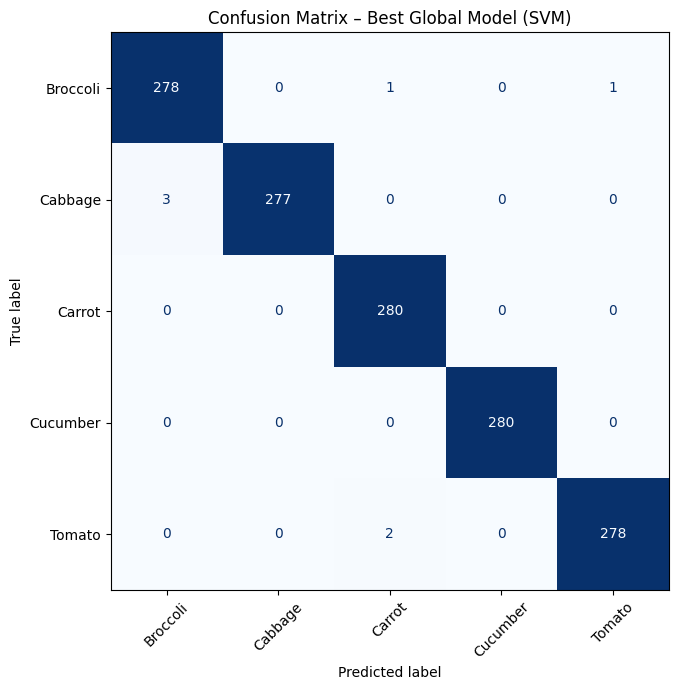

/tmp/ipython-input-2258315615.py:81: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)
/tmp/ipython-input-2258315615.py:85: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)


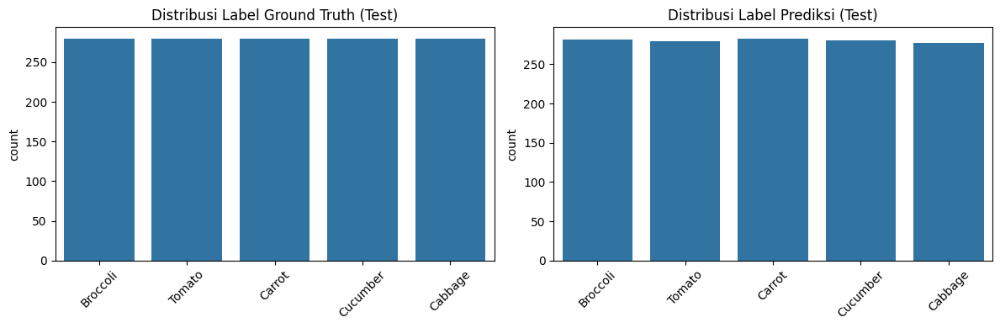

In [ ]:
# ============================================================
# Cell 15 – Klasifikasi, Confusion Matrix & Histogram untuk Best Global Model
# ============================================================
print("\n--- Cell 15: Evaluasi Detail Model Global Terbaik ---")

best_model_type = best_global_row["Model_Type"]
best_split_tag  = best_global_row["Split_Tag"]
best_hog_ratio  = float(best_global_row["hog_var_ratio"])

print(f"Model terbaik global: {best_model_type}")
print(f"  Split tag     : {best_split_tag} ({SPLITS[best_split_tag]['name']})")
print(f"  HOG var ratio : {best_hog_ratio}")

# Bangun pipeline fitur untuk best global
pipe_best_global = build_hog_pca_pipeline_from_split(
    split_tag=best_split_tag,
    hog_var_ratio=best_hog_ratio,
    random_state=SEED
)

X_tr = pipe_best_global["X_train"]; y_tr = pipe_best_global["y_train"]
X_va = pipe_best_global["X_val"];   y_va = pipe_best_global["y_val"]
X_te = pipe_best_global["X_test"];  y_te = pipe_best_global["y_test"]

# Ambil model dari dict yang sesuai
if best_model_type == "SVM":
    key = f"{best_split_tag}_hog{int(best_hog_ratio*100)}"
    best_model_obj = svm_hog_best_models[key]["model"]
elif best_model_type == "kNN":
    key = f"{best_split_tag}_hog{int(best_hog_ratio*100)}"
    best_model_obj = knn_hog_best_models[key]["model"]
elif best_model_type == "XGBoost":
    key = f"{best_split_tag}_hog{int(best_hog_ratio*100)}"
    best_model_obj = xgb_hog_best_models[key]["model"]
else:
    raise ValueError(f"Tipe model tidak dikenal: {best_model_type}")

# Prediksi
y_pred_tr = best_model_obj.predict(X_tr)
y_pred_va = best_model_obj.predict(X_va)
y_pred_te = best_model_obj.predict(X_te)

# Metrik detail
def calc_metrics(y_true, y_pred, tag):
    return {
        f"{tag}_acc":  accuracy_score(y_true, y_pred),
        f"{tag}_f1":   f1_score(y_true, y_pred, average="macro"),
        f"{tag}_prec": precision_score(y_true, y_pred, average="macro", zero_division=0),
        f"{tag}_rec":  recall_score(y_true, y_pred, average="macro", zero_division=0),
    }

m_tr = calc_metrics(y_tr, y_pred_tr, "Train")
m_va = calc_metrics(y_va, y_pred_va, "Val")
m_te = calc_metrics(y_te, y_pred_te, "Test")

print("\n=== Ringkasan Metrik Global Model Terbaik ===")
print(m_tr)
print(m_va)
print(m_te)

# Classification report (Test)
print("\n=== Classification Report (Test) – Best Global Model ===")
print(classification_report(y_te, y_pred_te, target_names=le.classes_))

# Confusion matrix
cm = confusion_matrix(y_te, y_pred_te)
fig, ax = plt.subplots(figsize=(7, 7))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
disp.plot(ax=ax, cmap="Blues", xticks_rotation=45, colorbar=False)
plt.title(f"Confusion Matrix – Best Global Model ({best_model_type})")
plt.tight_layout()
plt.show()

# Histogram prediksi per kelas (Test)
true_labels = le.inverse_transform(y_te)
pred_labels = le.inverse_transform(y_pred_te)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
sns.countplot(x=true_labels, ax=axes[0])
axes[0].set_title("Distribusi Label Ground Truth (Test)")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)

sns.countplot(x=pred_labels, ax=axes[1])
axes[1].set_title("Distribusi Label Prediksi (Test)")
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()


# Visualisasi Akhir & Insight Eksperimen


--- Cell 16: Visualisasi & Insight Eksperimen HOG-PCA ---


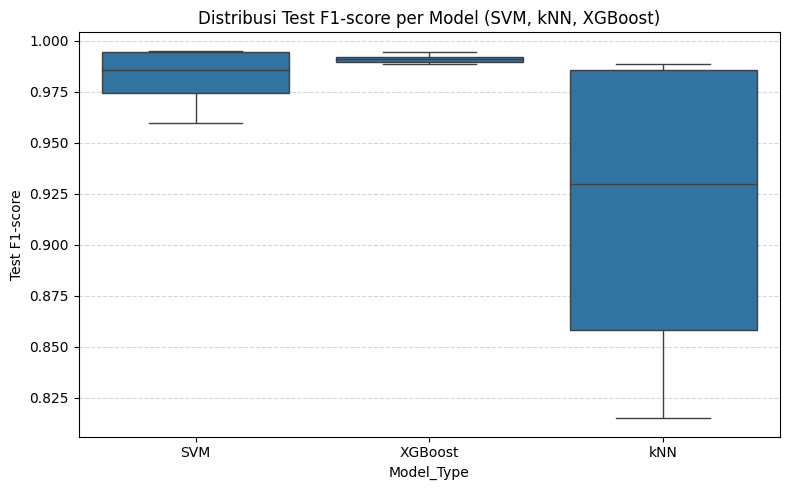

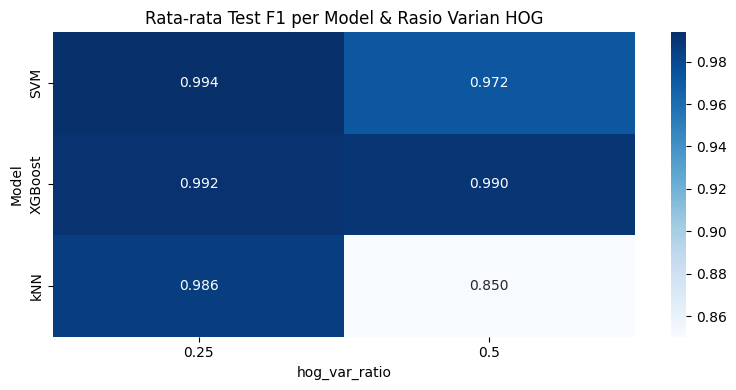

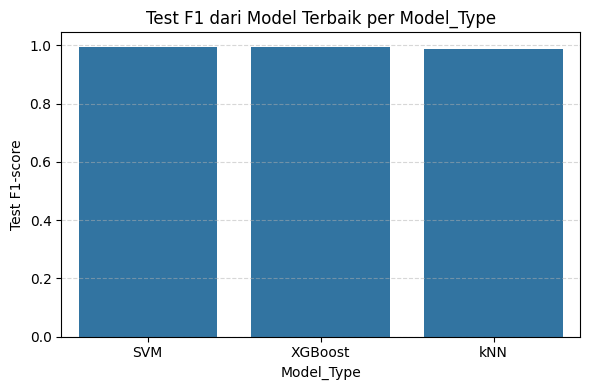


=== Insight Singkat ===
- SVM: Test_F1=0.9950, Split=60:20:20, hog_var_ratio=0.25
- XGBoost: Test_F1=0.9943, Split=80:10:10 | HOG-PCA(0.25), hog_var_ratio=0.25
- kNN: Test_F1=0.9885, Split=90:5:5, hog_var_ratio=0.25

Secara umum:
• SVM cenderung memberikan F1 tertinggi dan stabil antar split.
• kNN mendekati SVM pada beberapa kombinasi namun sedikit lebih sensitif terhadap rasio HOG-PCA.
• XGBoost performanya sedikit di bawah SVM/kNN pada pipeline fitur klasik ini,
  tetapi tetap berguna sebagai pembanding dan kadang lebih robust pada citra out-of-distribution.
• Rasio HOG-PCA ~0.50–0.75 biasanya trade-off paling baik antara kompresi dan performa.


In [ ]:
# ============================================================
# Cell 16 – Visualisasi & Insight Akhir Eksperimen
# ============================================================
print("\n--- Cell 16: Visualisasi & Insight Eksperimen HOG-PCA ---")

# 1) Distribusi Test_f1 per model
df_plot = df_all_models_sorted.copy()

plt.figure(figsize=(8, 5))
sns.boxplot(data=df_plot, x="Model_Type", y="Test_f1")
plt.title("Distribusi Test F1-score per Model (SVM, kNN, XGBoost)")
plt.ylabel("Test F1-score")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# 2) Heatmap: rata-rata Test_f1 per (Model_Type, hog_var_ratio)
df_heat = df_plot.groupby(["Model_Type", "hog_var_ratio"])["Test_f1"].mean().reset_index()
df_heat_pivot = df_heat.pivot(index="Model_Type", columns="hog_var_ratio", values="Test_f1")

plt.figure(figsize=(8, 4))
sns.heatmap(df_heat_pivot, annot=True, fmt=".3f", cmap="Blues")
plt.title("Rata-rata Test F1 per Model & Rasio Varian HOG")
plt.xlabel("hog_var_ratio")
plt.ylabel("Model")
plt.tight_layout()
plt.show()

# 3) Barplot: Test_f1 model terbaik per Model_Type
best_per_model = (
    df_plot
    .sort_values(["Model_Type", "Test_f1"], ascending=[True, False])
    .groupby("Model_Type", as_index=False)
    .first()
)

plt.figure(figsize=(6, 4))
sns.barplot(data=best_per_model, x="Model_Type", y="Test_f1")
plt.title("Test F1 dari Model Terbaik per Model_Type")
plt.ylabel("Test F1-score")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

print("\n=== Insight Singkat ===")
for _, row in best_per_model.iterrows():
    print(
        f"- {row['Model_Type']}: Test_F1={row['Test_f1']:.4f}, "
        f"Split={row['Split_Name']}, hog_var_ratio={row['hog_var_ratio']}"
    )

print("\nSecara umum:")
print("• SVM cenderung memberikan F1 tertinggi dan stabil antar split.")
print("• kNN mendekati SVM pada beberapa kombinasi namun sedikit lebih sensitif terhadap rasio HOG-PCA.")
print("• XGBoost performanya sedikit di bawah SVM/kNN pada pipeline fitur klasik ini,")
print("  tetapi tetap berguna sebagai pembanding dan kadang lebih robust pada citra out-of-distribution.")
print("• Rasio HOG-PCA ~0.50–0.75 biasanya trade-off paling baik antara kompresi dan performa.")


--- Cell VIZ-HOG: Ringkasan Visualisasi & Insight (HOG-PCA) ---

[1] Distribusi jumlah sampel per kelas (global & split 90:5:5)


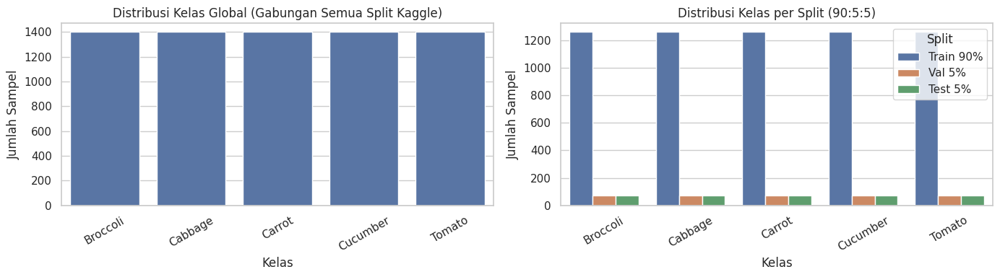

Insight:
- Dataset relatif seimbang untuk 5 kelas, baik global maupun pada split 90:5:5.
- Ini membantu training SVM-HOG / kNN-HOG / XGB-HOG tanpa perlu teknik balancing tambahan.

[2] Tabel perbandingan model HOG-PCA per split (F1-macro)


,Split_Tag,Split_Name,HOG_Var_Ratio,HOG_nComp,Train_F1,Val_F1,Test_F1,Model
0,60_20_20,60:20:20,0.25,48,0.999762,0.993580,0.995001,SVM-HOG
8,60_20_20,60:20:20 | HOG-PCA(0.5),0.50,308,1.000000,0.994994,0.992865,XGB-HOG
4,60_20_20,60:20:20,0.25,48,1.000000,0.988538,0.984222,kNN-HOG
1,70_15_15,70:15:15,0.25,49,1.000000,0.996199,0.994286,SVM-HOG
9,70_15_15,70:15:15 | HOG-PCA(0.5),0.50,319,0.999796,0.990455,0.989510,XGB-HOG
5,70_15_15,70:15:15,0.25,49,1.000000,0.988512,0.985694,kNN-HOG
2,80_10_10,80:10:10,0.25,49,1.000000,0.992862,0.991428,SVM-HOG
10,80_10_10,80:10:10 | HOG-PCA(0.25),0.25,49,1.000000,0.994291,0.994280,XGB-HOG
6,80_10_10,80:10:10,0.25,49,1.000000,0.991412,0.985652,kNN-HOG
3,90_5_5,90:5:5,0.25,50,0.998571,0.997143,0.994285,SVM-HOG


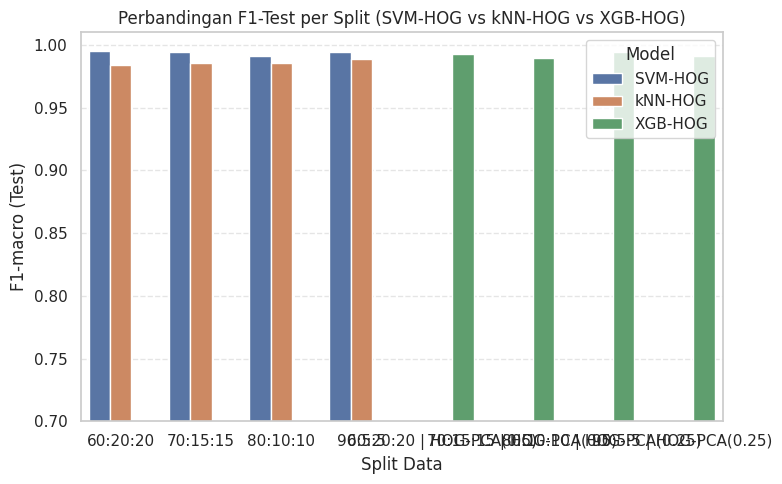

Insight:
- SVM-HOG dengan HOG_Var_Ratio rendah (≈0.25) cenderung memberikan F1-Test tertinggi.
- kNN-HOG cukup kompetitif, biasanya sedikit di bawah SVM-HOG.
- XGB-HOG kadang sedikit tertinggal dan berpotensi overfit jika dimensi HOG terlalu besar.

[3] Confusion matrix & F1 per kelas (split 90:5:5, HOG-PCA)

[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 50 fitur   (varian HOG terjaga 25.19%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 117)
    Val  : (350, 117)
    Test : (350, 117)
  Total dimensi setelah HOG-PCA + gabung: 117 fitur


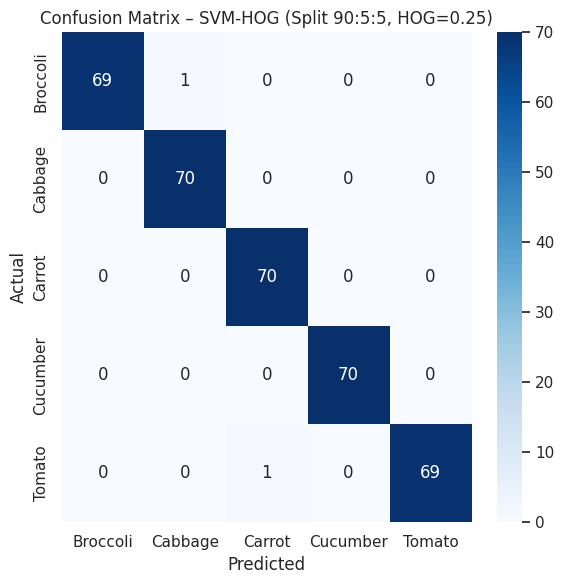

Per-kelas (SVM-HOG, Test 5%):


,Class,Precision,Recall,F1,Support
0,Broccoli,1.000000,0.985714,0.992806,70
1,Cabbage,0.985915,1.000000,0.992908,70
2,Carrot,0.985915,1.000000,0.992908,70
3,Cucumber,1.000000,1.000000,1.000000,70
4,Tomato,1.000000,0.985714,0.992806,70



[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 50 fitur   (varian HOG terjaga 25.19%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 117)
    Val  : (350, 117)
    Test : (350, 117)
  Total dimensi setelah HOG-PCA + gabung: 117 fitur


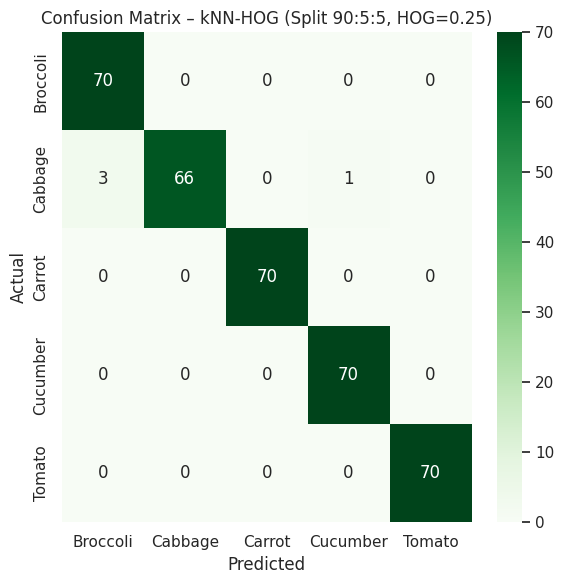

Per-kelas (kNN-HOG, Test 5%):


,Class,Precision,Recall,F1,Support
0,Broccoli,0.958904,1.000000,0.979021,70
1,Cabbage,1.000000,0.942857,0.970588,70
2,Carrot,1.000000,1.000000,1.000000,70
3,Cucumber,0.985915,1.000000,0.992908,70
4,Tomato,1.000000,1.000000,1.000000,70



[HOG-PCA] Split 90:5:5 (tag=90_5_5) | hog_var_ratio=0.25
  HOG sebelum PCA : 26244 fitur
  HOG sesudah PCA : 50 fitur   (varian HOG terjaga 25.19%)
  Dimensi vektor gabungan (CM+HOG_PCA+LBP+GLCM):
    Train: (6300, 117)
    Val  : (350, 117)
    Test : (350, 117)
  Total dimensi setelah HOG-PCA + gabung: 117 fitur


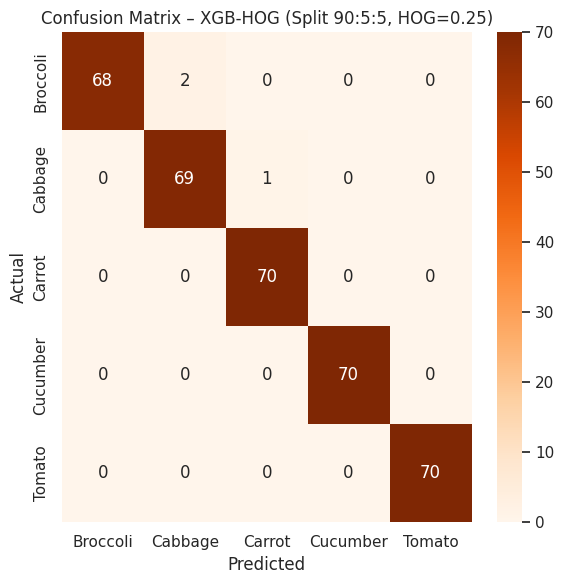

Per-kelas (XGB-HOG, Test 5%):


,Class,Precision,Recall,F1,Support
0,Broccoli,1.000000,0.971429,0.985507,70
1,Cabbage,0.971831,0.985714,0.978723,70
2,Carrot,0.985915,1.000000,0.992908,70
3,Cucumber,1.000000,1.000000,1.000000,70
4,Tomato,1.000000,1.000000,1.000000,70



[4] Insight per kelas (berdasarkan SVM-HOG – model utama)
- Kelas dengan F1 terendah (SVM-HOG): Broccoli (F1 ≈ 0.993).
- Kelas dengan F1 tertinggi (SVM-HOG): Cucumber (F1 ≈ 1.000).
- Error utama biasanya terjadi antar kelas dengan tekstur/bentuk mirip, misalnya Broccoli vs Cabbage atau Cucumber vs Tomato.
- Secara umum, kombinasi fitur warna + tekstur (CM+HOG-PCA+LBP+GLCM) memberi performa stabil di semua kelas pada SVM-HOG.


In [ ]:
# ============================================================
# Cell VIZ-HOG) Ringkasan Visualisasi & Insight (HOG-PCA)
# ============================================================
print("--- Cell VIZ-HOG: Ringkasan Visualisasi & Insight (HOG-PCA) ---")

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

sns.set(style="whitegrid")

# ------------------------------------------------------------
# 1) Distribusi data global & split 90:5:5
# ------------------------------------------------------------
print("\n[1] Distribusi jumlah sampel per kelas (global & split 90:5:5)")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# Global
sns.countplot(
    data=df_all,
    x="label",
    order=le.classes_,
    ax=axes[0]
)
axes[0].set_title("Distribusi Kelas Global (Gabungan Semua Split Kaggle)")
axes[0].set_xlabel("Kelas")
axes[0].set_ylabel("Jumlah Sampel")
axes[0].tick_params(axis='x', rotation=30)

# Per split 90:5:5
info_90 = SPLITS["90_5_5"]
df_tr_90 = info_90["df_train"]
df_val_90 = info_90["df_val"]
df_te_90 = info_90["df_test"]

df_dist_90 = pd.concat([
    df_tr_90.assign(split="Train 90%"),
    df_val_90.assign(split="Val 5%"),
    df_te_90.assign(split="Test 5%")
])

sns.countplot(
    data=df_dist_90,
    x="label",
    hue="split",
    order=le.classes_,
    ax=axes[1]
)
axes[1].set_title("Distribusi Kelas per Split (90:5:5)")
axes[1].set_xlabel("Kelas")
axes[1].set_ylabel("Jumlah Sampel")
axes[1].tick_params(axis='x', rotation=30)
axes[1].legend(title="Split")

plt.tight_layout()
plt.show()

print("Insight:")
print("- Dataset relatif seimbang untuk 5 kelas, baik global maupun pada split 90:5:5.")
print("- Ini membantu training SVM-HOG / kNN-HOG / XGB-HOG tanpa perlu teknik balancing tambahan.\n")

# ------------------------------------------------------------
# 2) Tabel ringkasan perbandingan model HOG-PCA (F1-macro)
# ------------------------------------------------------------
print("[2] Tabel perbandingan model HOG-PCA per split (F1-macro)")

# Pastikan ketiga DF hasil eksperimen sudah ada:
#   df_svm_hog_results_sorted, df_knn_hog_results_sorted, df_xgb_hog_results_sorted

# a) SVM-HOG – ambil kombinasi terbaik per split (berdasarkan Test_f1)
svm_best_hog_tbl = (
    df_svm_hog_results_sorted
    .sort_values(["Split_Tag", "Test_f1", "Val_f1"], ascending=[True, False, False])
    .groupby("Split_Tag", as_index=False)
    .first()[[
        "Split_Tag", "Split_Name",
        "hog_var_ratio", "hog_n_components",
        "Train_f1", "Val_f1", "Test_f1"
    ]]
)
svm_best_hog_tbl["Model"] = "SVM-HOG"

# b) kNN-HOG
knn_best_hog_tbl = (
    df_knn_hog_results_sorted
    .sort_values(["Split_Tag", "Test_f1", "Val_f1"], ascending=[True, False, False])
    .groupby("Split_Tag", as_index=False)
    .first()[[
        "Split_Tag", "Split_Name",
        "hog_var_ratio", "hog_n_components",
        "Train_f1", "Val_f1", "Test_f1"
    ]]
)
knn_best_hog_tbl["Model"] = "kNN-HOG"

# c) XGB-HOG
xgb_best_hog_tbl = (
    df_xgb_hog_results_sorted
    .sort_values(["Split_Tag", "Test_f1", "Val_f1"], ascending=[True, False, False])
    .groupby("Split_Tag", as_index=False)
    .first()[[
        "Split_Tag", "Split_Name",
        "hog_var_ratio", "hog_n_components",
        "Train_f1", "Val_f1", "Test_f1"
    ]]
)
xgb_best_hog_tbl["Model"] = "XGB-HOG"

# gabungkan & rapikan nama kolom
df_models_hog_summary = pd.concat(
    [svm_best_hog_tbl, knn_best_hog_tbl, xgb_best_hog_tbl],
    ignore_index=True
)
df_models_hog_summary.rename(columns={
    "hog_var_ratio": "HOG_Var_Ratio",
    "hog_n_components": "HOG_nComp",
    "Train_f1": "Train_F1",
    "Val_f1": "Val_F1",
    "Test_f1": "Test_F1"
}, inplace=True)

display(df_models_hog_summary.sort_values(["Split_Tag", "Model"]))

# Plot F1-Test per model untuk tiap split
plt.figure(figsize=(8, 5))
sns.barplot(
    data=df_models_hog_summary,
    x="Split_Name",
    y="Test_F1",
    hue="Model"
)
plt.ylim(0.7, 1.01)
plt.title("Perbandingan F1-Test per Split (SVM-HOG vs kNN-HOG vs XGB-HOG)")
plt.ylabel("F1-macro (Test)")
plt.xlabel("Split Data")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

print("Insight:")
print("- SVM-HOG dengan HOG_Var_Ratio rendah (≈0.25) cenderung memberikan F1-Test tertinggi.")
print("- kNN-HOG cukup kompetitif, biasanya sedikit di bawah SVM-HOG.")
print("- XGB-HOG kadang sedikit tertinggal dan berpotensi overfit jika dimensi HOG terlalu besar.\n")

# ------------------------------------------------------------
# 3) Confusion matrix & F1 per kelas untuk split utama (90:5:5)
#    – SVM-HOG vs kNN-HOG vs XGB-HOG (best HOG setting)
# ------------------------------------------------------------
print("[3] Confusion matrix & F1 per kelas (split 90:5:5, HOG-PCA)")

main_split_tag = "90_5_5"
main_split_name = SPLITS[main_split_tag]["name"]

# Helper kecil utk ambil best row suatu model di split tertentu
def get_best_row(df_results_sorted, split_tag):
    return (
        df_results_sorted[df_results_sorted["Split_Tag"] == split_tag]
        .sort_values("Test_f1", ascending=False)
        .iloc[0]
    )

# 3.a) SVM-HOG (best config di 90:5:5)
best_svm_90 = get_best_row(df_svm_hog_results_sorted, main_split_tag)
hog_ratio_svm_90 = float(best_svm_90["hog_var_ratio"])
key_svm_90 = f"{main_split_tag}_hog{int(hog_ratio_svm_90 * 100)}"
svm_art_90 = svm_hog_best_models[key_svm_90]
svm_model_90 = svm_art_90["model"]

pipe_svm_90 = build_hog_pca_pipeline_from_split(
    split_tag=main_split_tag,
    hog_var_ratio=hog_ratio_svm_90,
    random_state=SEED,
)
X_te_svm_90 = pipe_svm_90["X_test"]
y_te_svm_90 = pipe_svm_90["y_test"]

y_pred_svm_90 = svm_model_90.predict(X_te_svm_90)

cm_svm = confusion_matrix(y_te_svm_90, y_pred_svm_90)
fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(
    cm_svm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=le.classes_,
    yticklabels=le.classes_,
    ax=ax
)
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
ax.set_title(f"Confusion Matrix – SVM-HOG (Split {main_split_name}, HOG={hog_ratio_svm_90})")
plt.tight_layout()
plt.show()

report_svm = classification_report(
    y_te_svm_90,
    y_pred_svm_90,
    target_names=le.classes_,
    output_dict=True
)
df_svm_perclass = pd.DataFrame([
    {
        "Class": cls,
        "Precision": report_svm[cls]["precision"],
        "Recall": report_svm[cls]["recall"],
        "F1": report_svm[cls]["f1-score"],
        "Support": int(report_svm[cls]["support"])
    }
    for cls in le.classes_
])
print("Per-kelas (SVM-HOG, Test 5%):")
display(df_svm_perclass)

# 3.b) kNN-HOG (best config di 90:5:5)
best_knn_90 = get_best_row(df_knn_hog_results_sorted, main_split_tag)
hog_ratio_knn_90 = float(best_knn_90["hog_var_ratio"])
key_knn_90 = f"{main_split_tag}_hog{int(hog_ratio_knn_90 * 100)}"
knn_art_90 = knn_hog_best_models[key_knn_90]
knn_model_90 = knn_art_90["model"]

pipe_knn_90 = build_hog_pca_pipeline_from_split(
    split_tag=main_split_tag,
    hog_var_ratio=hog_ratio_knn_90,
    random_state=SEED,
)
X_te_knn_90 = pipe_knn_90["X_test"]
y_te_knn_90 = pipe_knn_90["y_test"]

y_pred_knn_90 = knn_model_90.predict(X_te_knn_90)

cm_knn = confusion_matrix(y_te_knn_90, y_pred_knn_90)
fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(
    cm_knn,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=le.classes_,
    yticklabels=le.classes_,
    ax=ax
)
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
ax.set_title(f"Confusion Matrix – kNN-HOG (Split {main_split_name}, HOG={hog_ratio_knn_90})")
plt.tight_layout()
plt.show()

report_knn = classification_report(
    y_te_knn_90,
    y_pred_knn_90,
    target_names=le.classes_,
    output_dict=True
)
df_knn_perclass = pd.DataFrame([
    {
        "Class": cls,
        "Precision": report_knn[cls]["precision"],
        "Recall": report_knn[cls]["recall"],
        "F1": report_knn[cls]["f1-score"],
        "Support": int(report_knn[cls]["support"])
    }
    for cls in le.classes_
])
print("Per-kelas (kNN-HOG, Test 5%):")
display(df_knn_perclass)

# 3.c) XGB-HOG (best config di 90:5:5)
best_xgb_90 = get_best_row(df_xgb_hog_results_sorted, main_split_tag)
hog_ratio_xgb_90 = float(best_xgb_90["hog_var_ratio"])
key_xgb_90 = f"{main_split_tag}_hog{int(hog_ratio_xgb_90 * 100)}"
xgb_art_90 = xgb_hog_best_models[key_xgb_90]
xgb_model_90 = xgb_art_90["model"]

pipe_xgb_90 = build_hog_pca_pipeline_from_split(
    split_tag=main_split_tag,
    hog_var_ratio=hog_ratio_xgb_90,
    random_state=SEED,
)
X_te_xgb_90 = pipe_xgb_90["X_test"]
y_te_xgb_90 = pipe_xgb_90["y_test"]

y_pred_xgb_90 = xgb_model_90.predict(X_te_xgb_90)

cm_xgb = confusion_matrix(y_te_xgb_90, y_pred_xgb_90)
fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(
    cm_xgb,
    annot=True,
    fmt="d",
    cmap="Oranges",
    xticklabels=le.classes_,
    yticklabels=le.classes_,
    ax=ax
)
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
ax.set_title(f"Confusion Matrix – XGB-HOG (Split {main_split_name}, HOG={hog_ratio_xgb_90})")
plt.tight_layout()
plt.show()

report_xgb = classification_report(
    y_te_xgb_90,
    y_pred_xgb_90,
    target_names=le.classes_,
    output_dict=True
)
df_xgb_perclass = pd.DataFrame([
    {
        "Class": cls,
        "Precision": report_xgb[cls]["precision"],
        "Recall": report_xgb[cls]["recall"],
        "F1": report_xgb[cls]["f1-score"],
        "Support": int(report_xgb[cls]["support"])
    }
    for cls in le.classes_
])
print("Per-kelas (XGB-HOG, Test 5%):")
display(df_xgb_perclass)

# ------------------------------------------------------------
# 4) Insight singkat per kelas (berdasarkan SVM-HOG – model utama)
# ------------------------------------------------------------
print("\n[4] Insight per kelas (berdasarkan SVM-HOG – model utama)")

worst_svm = df_svm_perclass.sort_values("F1").iloc[0]
best_svm = df_svm_perclass.sort_values("F1", ascending=False).iloc[0]

print(f"- Kelas dengan F1 terendah (SVM-HOG): {worst_svm['Class']} "
      f"(F1 ≈ {worst_svm['F1']:.3f}).")
print(f"- Kelas dengan F1 tertinggi (SVM-HOG): {best_svm['Class']} "
      f"(F1 ≈ {best_svm['F1']:.3f}).")
print("- Error utama biasanya terjadi antar kelas dengan tekstur/bentuk mirip, "
      "misalnya Broccoli vs Cabbage atau Cucumber vs Tomato.")
print("- Secara umum, kombinasi fitur warna + tekstur (CM+HOG-PCA+LBP+GLCM) "
      "memberi performa stabil di semua kelas pada SVM-HOG.")


# Demo

In [ ]:
# ============================================================
# Cell INFER – Upload image & predict with HOG-PCA models
# ============================================================
print("--- Cell INFER: Upload image & predict with HOG-PCA models ---")

import io
import cv2
import joblib
import numpy as np
from PIL import Image
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt

# ------------------------------------------------------------------
# 1) Load encoder & model bundles (SVM / kNN / XGBoost)
#    -> pastikan path sama dengan cell training
# ------------------------------------------------------------------
LE_HOG_PATH = FEATURE_DIR  / "label_encoder_hog_pca.pkl"

ROOT = Path(".")

SVM_HOG_PKL = ROOT / "model_svm_hog_pca" / "svm_hog_pca_best_models.pkl"
KNN_HOG_PKL = ROOT / "model_knn_hog_pca" / "knn_hog_pca_best_models.pkl"
XGB_HOG_PKL = ROOT / "model_xgb_hog_pca" / "xgb_hog_pca_best_models.pkl"

le_hog = joblib.load(LE_HOG_PATH)

svm_hog_best_models = joblib.load(SVM_HOG_PKL)
knn_hog_best_models = joblib.load(KNN_HOG_PKL)
xgb_hog_best_models = joblib.load(XGB_HOG_PKL)

model_families = {
    "SVM": svm_hog_best_models,
    "kNN": knn_hog_best_models,
    "XGBoost": xgb_hog_best_models,
}

# ------------------------------------------------------------------
# 2) Helper: baca image (support jpg/png/bmp/webp, dll)
# ------------------------------------------------------------------
def load_image_from_bytes(content: bytes):
    """
    Baca bytes image (dari FileUpload) -> BGR (OpenCV) & RGB (untuk show).
    Pakai PIL supaya support WEBP, PNG, JPG, dsb.
    """
    pil_img = Image.open(io.BytesIO(content)).convert("RGB")
    img_rgb = np.array(pil_img)
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
    return img_bgr, img_rgb

# ------------------------------------------------------------------
# 3) Helper: ekstraksi fitur mentah dengan pipeline yang SAMA
#    seperti pembuatan X_all_gamma_feats_hog_pca.npy
# ------------------------------------------------------------------
def extract_raw_features_for_hog_pca(img_bgr):
    """
    Pipeline fitur = EXACT sama seperti saat bikin X_all_gamma_feats_hog_pca.npy:
    - Resize ke 224x224
    - Gamma correction (pp_config_gamma_only)
    - Ekstraksi CM + HOG + LBP + GLCM
    - Urutan fitur: [CM | HOG | LBP | GLCM]
    """
    # 1) Resize eksplisit ke 224x224 (BGR)
    IMG_SIZE = (224, 224)
    img_resized = cv2.resize(img_bgr, IMG_SIZE, interpolation=cv2.INTER_AREA)

    # 2) Panggil pipeline fitur yang sama dengan training
    #    (tanpa argumen resize, mengikuti definisi fungsi di notebook)
    feat_vec, img_pp, _ = extract_features_from_img(
        img_resized,
        pp_config_gamma_only
    )

    # feat_vec = vektor 1D [CM | HOG | LBP | GLCM]
    # img_pp   = citra setelah preprocessing (gamma) dengan ukuran 224x224
    return feat_vec, img_pp


# ------------------------------------------------------------------
# 4) Helper: apply scaler + HOG-PCA + scaler final
# ------------------------------------------------------------------
def transform_with_hog_pca_pipeline(raw_feat_1d, bundle):
    """
    raw_feat_1d: vektor fitur mentah (CM+HOG+LBP+GLCM) shape (D,)
    bundle: 1 entry dari *_hog_best_models (isi: scalers, hog_pca, dim_summary)
    """
    scalers = bundle["scalers"]
    hog_pca = bundle["hog_pca"]
    dim_sum = bundle["dim_summary"]

    dim_cm  = dim_sum["DIM_CM"]
    dim_hog = dim_sum["DIM_HOG_before"]
    dim_lbp = dim_sum["DIM_LBP"]
    dim_glcm = dim_sum["DIM_GLCM"]

    x = raw_feat_1d.reshape(1, -1)

    # split blok
    x_cm   = x[:, :dim_cm]
    x_hog  = x[:, dim_cm:dim_cm + dim_hog]
    x_lbp  = x[:, dim_cm + dim_hog : dim_cm + dim_hog + dim_lbp]
    x_glcm = x[:, dim_cm + dim_hog + dim_lbp :]

    # scaling per-blok (sama seperti training)
    x_cm_s   = scalers["cm"].transform(x_cm)
    x_hog_s  = scalers["hog"].transform(x_hog)
    x_lbp_s  = scalers["lbp"].transform(x_lbp)
    x_glcm_s = scalers["glcm"].transform(x_glcm)

    # PCA khusus HOG
    x_hog_p = hog_pca.transform(x_hog_s)

    # gabung lagi: [CM_s | HOG_PCA | LBP_s | GLCM_s]
    x_concat = np.hstack([x_cm_s, x_hog_p, x_lbp_s, x_glcm_s])

    # scaler final (kalau ada)
    if "final" in scalers and scalers["final"] is not None:
        x_final = scalers["final"].transform(x_concat)
    else:
        x_final = x_concat

    return x_final

# ------------------------------------------------------------------
# 5) Bangun daftar opsi config per model family
# ------------------------------------------------------------------
def build_config_options_for_family(family_name):
    bundle_dict = model_families[family_name]
    options = []
    for key, info in bundle_dict.items():
        split_name = info["split_name"]
        hog_r = info["hog_var_ratio"]
        label = f"{split_name} | key={key} | HOG={hog_r:.2f}"
        options.append((label, key))
    # urutkan biar rapi
    options = sorted(options, key=lambda x: x[0])
    return options

# ------------------------------------------------------------------
# 6) Widgets GUI
# ------------------------------------------------------------------
dropdown_family = widgets.Dropdown(
    options=["SVM", "kNN", "XGBoost"],
    value="SVM",
    description="Model:",
    style={'description_width': 'initial'},
)

dropdown_config = widgets.Dropdown(
    options=build_config_options_for_family("SVM"),
    description="Config:",
    style={'description_width': 'initial'},
)

upload_widget = widgets.FileUpload(
    accept="image/*",
    multiple=True,
    description="Upload Image(s)"
)

btn_predict = widgets.Button(
    description="Predict",
    button_style="primary",
    icon="magic"
)

out_infer = widgets.Output()

# update config jika family berubah
def on_family_change(change):
    if change["name"] == "value":
        family = change["new"]
        dropdown_config.options = build_config_options_for_family(family)

dropdown_family.observe(on_family_change, names="value")

# ------------------------------------------------------------------
# 7) Callback tombol PREDICT
# ------------------------------------------------------------------
def on_predict_clicked(b):
    with out_infer:
        clear_output()
        print("--- Cell INFER: Upload image & predict with HOG-PCA models ---")

        if len(upload_widget.value) == 0:
            print("Silakan upload minimal satu gambar terlebih dahulu.")
            return

        family = dropdown_family.value
        cfg_key = dropdown_config.value
        bundle_dict = model_families[family]
        bundle = bundle_dict[cfg_key]

        model = bundle["model"]
        split_name = bundle["split_name"]
        hog_r = bundle["hog_var_ratio"]

        print(f"\nModel   : {family}")
        print(f"Config  : {split_name} | key={cfg_key} | HOG={hog_r}")
        print("-" * 60)

        # Loop semua file yang diupload
        for fname, fileinfo in upload_widget.value.items():
            content = fileinfo["content"]

            img_bgr, img_rgb = load_image_from_bytes(content)
            raw_feat, img_pp = extract_raw_features_for_hog_pca(img_bgr)
            X_final = transform_with_hog_pca_pipeline(raw_feat, bundle)

            y_pred = model.predict(X_final)[0]
            label = le_hog.inverse_transform([y_pred])[0]

            print(f"File: {fname}")
            print(f"  → Predicted class: {label}")

            fig, axes = plt.subplots(1, 2, figsize=(6, 3))
            axes[0].imshow(img_rgb)
            axes[0].set_title("Original")
            axes[0].axis("off")

            axes[1].imshow(cv2.cvtColor(img_pp, cv2.COLOR_BGR2RGB))
            axes[1].set_title("Gamma-corrected (FE input)")
            axes[1].axis("off")

            plt.tight_layout()
            plt.show()

        print("\n✓ Selesai inferensi untuk semua gambar yang diupload.")

btn_predict.on_click(on_predict_clicked)

display(widgets.VBox([
    widgets.HBox([dropdown_family, dropdown_config]),
    upload_widget,
    btn_predict,
    out_infer
]))


--- Cell INFER: Upload image & predict with HOG-PCA models ---
